# 불량품 예측

불량품을 예측하기 위해 다음과 같은 함수화 정리를 진행한다. 혼란을 막기 위해 모든 과정을 함수화 하기로 한다.  
목차는 다음과 같다.

- 1. Load packages & Data
- 2. Function

## 1. Load Packages & Data

In [1]:
### ide packages
import os
from pprint import pprint
import numpy as np
import pandas as pd
import random
import string
from tqdm import tqdm

# sklearn preprocessing
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, cross_val_score
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    f1_score,
    precision_score,
    make_scorer,
    roc_curve,
    auc,
    precision_recall_curve,
    recall_score,
    silhouette_score,
)

# models
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedKFold
import xgboost as xgb
from catboost import CatBoostClassifier, Pool
from lightgbm import LGBMClassifier, plot_metric
from xgboost import XGBClassifier
import lightgbm as lgb
from sklearn.cluster import KMeans

# plot
import seaborn as sns
import matplotlib.pyplot as plt
import plotly
import plotly.graph_objects as go
import plotly.express as px

# tuning
import optuna

/home/elicer/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# load data
load_dir = './data/'
train = pd.read_csv(load_dir + "train.csv")
test = pd.read_csv(load_dir + "test.csv")

## 2. Functions

In [3]:
# 평가 스코어 지정하기
f1_scorer = make_scorer(f1_score, pos_label=1, average = 'binary')

# 평가 매트릭 계산 결과 보여주기
def get_clf_eval(y_test, y_pred=None):
    confusion = confusion_matrix(y_test, y_pred, labels=[True, False])
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, labels=[True, False])
    recall = recall_score(y_test, y_pred)
    F1 = f1_score(y_test, y_pred, labels=[True, False])

    print("오차행렬:\n", confusion)
    print("\n정확도: {:.4f}".format(accuracy))
    print("정밀도: {:.4f}".format(precision))
    print("재현율: {:.4f}".format(recall))
    print("F1: {:.4f}".format(F1))

In [4]:
# 해당 공정 맞춤형 위치 옮기기
def move_data(data):
    # divide
    dam = data.filter(regex='_Dam')
    fill1 = data.filter(regex='_Fill1')
    fill2 = data.filter(regex='_Fill2')
    autoclave = data.filter(regex='_AutoClave')
    target = data['target']

    # dam
    dam = dam.dropna(axis=1, how='all')
    dam = dam.drop(columns='HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Dam')
    dam_mask = dam[dam['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].isin(['OK', np.nan])].iloc[:, 24:].shift(-1, axis = 1).values
    dam.loc[dam['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].isin(['OK', np.nan]), dam.columns[24:]] = dam_mask
    dam = dam.drop(columns='WorkMode Collect Result_Dam')

    # fill1
    fill1 = fill1.dropna(axis=1, how='all')
    fill1 = fill1.drop(columns='HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Fill1')
    fill1_mask = fill1[fill1['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1'].isin(['OK', np.nan])].iloc[:, 14:].shift(-1, axis = 1).values
    fill1.loc[fill1['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1'].isin(['OK', np.nan]), fill1.columns[14:]] = fill1_mask
    fill1 = fill1.drop(columns='WorkMode Collect Result_Fill1')

    # fill2
    fill2 = fill2.dropna(axis=1, how='all')
    fill2 = fill2.drop(columns='HEAD NORMAL COORDINATE X AXIS(Stage1) Judge Value_Fill2')
    fill2_mask = fill2[fill2['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill2'].isin(['OK', np.nan])].iloc[:, 24:].shift(-1, axis = 1).values
    fill2.loc[fill2['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill2'].isin(['OK', np.nan]), fill2.columns[24:]] = fill2_mask
    fill2 = fill2.drop(columns='WorkMode Collect Result_Fill2')

    # CONCAT
    data = pd.concat([dam, fill1, fill2, autoclave, target], axis=1)
    
    return data

In [5]:
# 칼럼 위치 변경
def swap_columns(df, condition, col1, col2):
    # 조건에 해당하는 행 필터링
    filtered_df = df[condition]
    
    # 값 교환
    df.loc[condition, [col1, col2]] = filtered_df[[col1, col2]].copy().iloc[:, ::-1].values

    return df

In [6]:
# Equipment 방향 통일과 잘못된 위치 재조정하기
def change_data(train, test):
    # train
    train['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'] = train['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].astype(float)
    train['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'] = train['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'].astype(float)


    # 이동 전
    X_sum_down_1 = train[train['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].astype(float) < 500]['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].astype(float).mean()
    X_sum_down_2 = train[train['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'].astype(float) < 500]['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'].astype(float).mean()
    X_sum_up_1 = train[train['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].astype(float) > 500]['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].astype(float).mean()
    X_sum_up_2 = train[train['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'].astype(float) > 500]['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'].astype(float).mean()

    X_sum_down = (X_sum_down_1 - X_sum_down_2) / 2 # stage1에서 빼고, Stage3에서 더하기 <500
    X_sum_up = (X_sum_up_2 - X_sum_up_1) / 2 # stage1에서 더하고, Stage 3에서 빼기

    train.loc[train['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'] += X_sum_up
    train.loc[train['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'] -= X_sum_up

    train.loc[train['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].astype(float) < 500, 'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'] -= X_sum_down
    train.loc[train['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'].astype(float) < 500, 'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'] += X_sum_down

    # test
    test['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'] = test['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].astype(float)
    test['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'] = test['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'].astype(float)


    # 이동 전
    test.loc[test['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'] += X_sum_up
    test.loc[test['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'] -= X_sum_up

    test.loc[test['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].astype(float) < 500, 'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'] -= X_sum_down
    test.loc[test['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'].astype(float) < 500, 'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'] += X_sum_down

    # train
    Y_sum_dam_1 = train[train['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam'].astype(float) < 500]['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam'].astype(float).mean()
    Y_sum_dam_2 = train[train['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam'].astype(float) > 500]['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam'].astype(float).mean()

    train.loc[train['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam'] = Y_sum_dam_1 + Y_sum_dam_2 - train.loc[train['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam']

    Y_sum_dam_3 = train[train['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam'].astype(float) < 500]['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam'].astype(float).mean()
    Y_sum_dam_4 = train[train['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam'].astype(float) > 500]['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam'].astype(float).mean()

    train.loc[train['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam'] = Y_sum_dam_3 + Y_sum_dam_4 - train.loc[train['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam']

    Y_sum_dam_5 = train[train['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam'].astype(float) < 500]['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam'].astype(float).mean()
    Y_sum_dam_6 = train[train['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam'].astype(float) > 500]['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam'].astype(float).mean()

    train.loc[train['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam'] = Y_sum_dam_5 + Y_sum_dam_6 - train.loc[train['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam']

    Y_sum_fill_1 = train[train['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1'].astype(float) > 500]['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1'].astype(float).mean()
    Y_sum_fill_2 = train[train['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1'].astype(float) < 500]['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1'].astype(float).mean()

    train.loc[train['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1'] = Y_sum_fill_1 + Y_sum_fill_2 - train.loc[train['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1']

    Y_sum_fill_3 = train[train['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1'].astype(float) > 500]['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1'].astype(float).mean()
    Y_sum_fill_4 = train[train['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1'].astype(float) < 500]['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1'].astype(float).mean()

    train.loc[train['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1'] = Y_sum_fill_3 + Y_sum_fill_4 - train.loc[train['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1']

    Y_sum_fill_5 = train[train['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1'].astype(float) > 500]['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1'].astype(float).mean()
    Y_sum_fill_6 = train[train['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1'].astype(float) < 500]['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1'].astype(float).mean()
    train.loc[train['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1'] = Y_sum_fill_5 + Y_sum_fill_6 - train.loc[train['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1']

    # test
    test.loc[test['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam'] = Y_sum_dam_1 + Y_sum_dam_2 - test.loc[test['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam']
    test.loc[test['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam'] = Y_sum_dam_5 + Y_sum_dam_6 - test.loc[test['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam']
    test.loc[test['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam'] = Y_sum_dam_3 + Y_sum_dam_4 - test.loc[test['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam']
    test.loc[test['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1'] = Y_sum_fill_1 + Y_sum_fill_2 - test.loc[test['HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1']
    test.loc[test['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1'] = Y_sum_fill_5 + Y_sum_fill_6 - test.loc[test['HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1']
    test.loc[test['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1'] = Y_sum_fill_3 + Y_sum_fill_4 - test.loc[test['HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1'].astype(float) > 500, 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1']

    ### Train
    # 조건을 만족하는 행 인덱스를 찾음
    condition = train['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'].astype(float) >= 200

    # DISCHARGED TIME OF RESIN(Stage1) 
    swap_columns(train, condition, 'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam', 'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam')

    # Dispense Volume(Stage1)
    swap_columns(train, condition, 'Dispense Volume(Stage1) Collect Result_Dam', 'Dispense Volume(Stage3) Collect Result_Dam')

    # HEAD NORMAL COORDINATE Y AXIS(Stage1)
    swap_columns(train, condition, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam', 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam')

    # HEAD NORMAL COORDINATE Z AXIS(Stage1)
    swap_columns(train, condition, 'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam', 'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Dam')

    # Stage1 Circle1 Distance Speed Collect
    swap_columns(train, condition, 'Stage1 Circle1 Distance Speed Collect Result_Dam', 'Stage3 Circle1 Distance Speed Collect Result_Dam')
    swap_columns(train, condition, 'Stage1 Circle2 Distance Speed Collect Result_Dam', 'Stage3 Circle2 Distance Speed Collect Result_Dam')
    swap_columns(train, condition, 'Stage1 Circle3 Distance Speed Collect Result_Dam', 'Stage3 Circle3 Distance Speed Collect Result_Dam')
    swap_columns(train, condition, 'Stage1 Circle4 Distance Speed Collect Result_Dam', 'Stage3 Circle4 Distance Speed Collect Result_Dam')

    # Stage1 Line1 Distance Speed Collect
    swap_columns(train, condition, 'Stage1 Line1 Distance Speed Collect Result_Dam', 'Stage3 Line1 Distance Speed Collect Result_Dam')
    swap_columns(train, condition, 'Stage1 Line2 Distance Speed Collect Result_Dam', 'Stage3 Line2 Distance Speed Collect Result_Dam')
    swap_columns(train, condition, 'Stage1 Line3 Distance Speed Collect Result_Dam', 'Stage3 Line3 Distance Speed Collect Result_Dam')
    swap_columns(train, condition, 'Stage1 Line4 Distance Speed Collect Result_Dam', 'Stage3 Line4 Distance Speed Collect Result_Dam')

    # THICKNESS 1
    # swap_columns(train, condition, 'THICKNESS 1 Collect Result_Dam', 'THICKNESS 3 Collect Result_Dam')

    ### 젤 마지막에 와야됨!!!!
    # HEAD NORMAL COORDINATE X AXIS(Stage1)
    swap_columns(train, condition, 'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam', 'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam')


    ### Test
    # 조건을 만족하는 행 인덱스를 찾음
    condition = test['HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam'].astype(float) >= 200

    # DISCHARGED TIME OF RESIN(Stage1) 
    swap_columns(test, condition, 'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam', 'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam')

    # Dispense Volume(Stage1)
    swap_columns(test, condition, 'Dispense Volume(Stage1) Collect Result_Dam', 'Dispense Volume(Stage3) Collect Result_Dam')

    # HEAD NORMAL COORDINATE Y AXIS(Stage1)
    swap_columns(test, condition, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam', 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam')

    # HEAD NORMAL COORDINATE Z AXIS(Stage1)
    swap_columns(test, condition, 'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam', 'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Dam')

    # Stage1 Circle1 Distance Speed Collect
    swap_columns(test, condition, 'Stage1 Circle1 Distance Speed Collect Result_Dam', 'Stage3 Circle1 Distance Speed Collect Result_Dam')
    swap_columns(test, condition, 'Stage1 Circle2 Distance Speed Collect Result_Dam', 'Stage3 Circle2 Distance Speed Collect Result_Dam')
    swap_columns(test, condition, 'Stage1 Circle3 Distance Speed Collect Result_Dam', 'Stage3 Circle3 Distance Speed Collect Result_Dam')
    swap_columns(test, condition, 'Stage1 Circle4 Distance Speed Collect Result_Dam', 'Stage3 Circle4 Distance Speed Collect Result_Dam')

    # Stage1 Line1 Distance Speed Collect
    swap_columns(test, condition, 'Stage1 Line1 Distance Speed Collect Result_Dam', 'Stage3 Line1 Distance Speed Collect Result_Dam')
    swap_columns(test, condition, 'Stage1 Line2 Distance Speed Collect Result_Dam', 'Stage3 Line2 Distance Speed Collect Result_Dam')
    swap_columns(test, condition, 'Stage1 Line3 Distance Speed Collect Result_Dam', 'Stage3 Line3 Distance Speed Collect Result_Dam')
    swap_columns(test, condition, 'Stage1 Line4 Distance Speed Collect Result_Dam', 'Stage3 Line4 Distance Speed Collect Result_Dam')

    # THICKNESS 1
    # swap_columns(train, condition, 'THICKNESS 1 Collect Result_Dam', 'THICKNESS 3 Collect Result_Dam')

    ### 젤 마지막에 와야됨!!!!
    # HEAD NORMAL COORDINATE X AXIS(Stage1)
    swap_columns(test, condition, 'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam', 'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam')
    
    ### Train
    # 조건을 만족하는 행 인덱스를 찾음
    condition = train['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1'].astype(float) < 200

    # DISCHARGED TIME OF RESIN(Stage1)
    swap_columns(train, condition, 'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Fill1', 'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Fill1')

    # Dispense Volume(Stage1)
    swap_columns(train, condition, 'Dispense Volume(Stage1) Collect Result_Fill1', 'Dispense Volume(Stage3) Collect Result_Fill1')

    # HEAD NORMAL COORDINATE Y AXIS(Stage1)
    swap_columns(train, condition, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1', 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1')

    # HEAD NORMAL COORDINATE Z AXIS(Stage1)
    swap_columns(train, condition, 'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Fill1', 'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Fill1')

    # 반드시 마지막으로 와야함!!!!
    # HEAD NORMAL COORDINATE X AXIS(Stage1)
    swap_columns(train, condition, 'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1', 'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Fill1')

    ### Test
    condition = test['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1'].astype(float) < 200

    # DISCHARGED TIME OF RESIN(Stage1)
    swap_columns(test, condition, 'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Fill1', 'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Fill1')

    # Dispense Volume(Stage1)
    swap_columns(test, condition, 'Dispense Volume(Stage1) Collect Result_Fill1', 'Dispense Volume(Stage3) Collect Result_Fill1')

    # HEAD NORMAL COORDINATE Y AXIS(Stage1)
    swap_columns(test, condition, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1', 'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1')

    # HEAD NORMAL COORDINATE Z AXIS(Stage1)
    swap_columns(test, condition, 'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Fill1', 'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Fill1')

    # 반드시 마지막으로 와야함!!!!
    # HEAD NORMAL COORDINATE X AXIS(Stage1)
    swap_columns(test, condition, 'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1', 'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Fill1')
    
    ### Train
    condition = train['HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Fill1'].astype(float) > 500

    # DISCHARGED TIME OF RESIN(Stage1)
    swap_columns(train, condition, 'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Fill1', 'DISCHARGED TIME OF RESIN(Stage2) Collect Result_Fill1')

    # Dispense Volume(Stage1)
    swap_columns(train, condition, 'Dispense Volume(Stage1) Collect Result_Fill1', 'Dispense Volume(Stage2) Collect Result_Fill1')

    # HEAD NORMAL COORDINATE Y AXIS(Stage1)
    swap_columns(train, condition, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1', 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1')

    # HEAD NORMAL COORDINATE Z AXIS(Stage1)
    swap_columns(train, condition, 'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Fill1', 'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Fill1')

    # 반드시 마지막으로 와야함!!!!
    # HEAD NORMAL COORDINATE X AXIS(Stage1)
    swap_columns(train, condition, 'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1', 'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Fill1')

    ### Test
    condition = test['HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Fill1'].astype(float) > 500

    # DISCHARGED TIME OF RESIN(Stage1)
    swap_columns(test, condition, 'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Fill1', 'DISCHARGED TIME OF RESIN(Stage2) Collect Result_Fill1')

    # Dispense Volume(Stage1)
    swap_columns(test, condition, 'Dispense Volume(Stage1) Collect Result_Fill1', 'Dispense Volume(Stage2) Collect Result_Fill1')

    # HEAD NORMAL COORDINATE Y AXIS(Stage1)
    swap_columns(test, condition, 'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1', 'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1')

    # HEAD NORMAL COORDINATE Z AXIS(Stage1)
    swap_columns(test, condition, 'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Fill1', 'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Fill1')

    # 반드시 마지막으로 와야함!!!!
    # HEAD NORMAL COORDINATE X AXIS(Stage1)
    swap_columns(test, condition, 'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1', 'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Fill1')

    return train, test

In [7]:
# Dam, Fill1, Fill2에서 지정된 값이 다를 경우 Abnormal 
def inconsistant(data, columnname, iwantthiscolumnsname, is_train = True):
    # 장비 번호가 다르면 불일치
    if is_train:
        cri = [
            df_train[columnname + '_Dam'] != df_train[columnname + '_Fill1'],
            df_train[columnname + '_Dam'] != df_train[columnname + '_Fill2'],
            df_train[columnname + '_Fill1'] != df_train[columnname + '_Fill2'],
            data[iwantthiscolumnsname] == 1
        ]
        
    else:
        cri = [
            df_test[columnname + '_Dam'] != df_test[columnname + '_Fill1'],
            df_test[columnname + '_Dam'] != df_test[columnname + '_Fill2'],
            df_test[columnname + '_Fill1'] != df_test[columnname + '_Fill1'],
            data[iwantthiscolumnsname] == 1
        ]
    con = [1, 1, 1, 1]

    data[iwantthiscolumnsname] = np.select(cri, con, default = 0)

In [8]:
# 변수 세팅
def variable_setting(types, tr, te, columns_to_convert, columns_to):
    train = tr.copy()
    test = te.copy()
    
    if types == 'catboost':
        dtype = 'string'  # 원하는 데이터 타입
        for column in columns_to_convert + columns_to:
            train[column] = train[column].astype(dtype)
            test[column] = test[column].astype(dtype)

        dtype = 'category'  # 원하는 데이터 타입
        for column in columns_to_convert + columns_to:
            train[column] = train[column].astype(dtype)
            test[column] = test[column].astype(dtype)
            
    elif types == 'lightgbm':
        dtype = 'float'  # 원하는 데이터 타입
        for column in columns_to_convert + columns_to:
            train[column] = train[column].astype(dtype)
            test[column] = test[column].astype(dtype)

        dtype = 'category'  # 원하는 데이터 타입
        for column in columns_to_convert + columns_to:
            train[column] = train[column].astype(dtype)
            test[column] = test[column].astype(dtype)
            
    elif types == 'xgboost':
        dtype = 'float'  # 원하는 데이터 타입
        for column in columns_to_convert + columns_to:
            train[column] = train[column].astype(dtype)
            test[column] = test[column].astype(dtype)
            
        dtype = 'category'  # 원하는 데이터 타입
        for column in columns_to_convert + columns_to:
            train[column] = train[column].astype(dtype)
            test[column] = test[column].astype(dtype)
            
    return train, test

In [9]:
def model_best_threshold(model, X_valid, y_valid):
    # Precision - Recall
    y_pred_proba = model.predict_proba(X_valid)[:, 1]

    precision, recall, thresholds = precision_recall_curve(y_valid, y_pred_proba)
    f1_scores = 2*recall*precision / (recall + precision)
    cat_best_threshold = thresholds[np.argmax(f1_scores)]
    y_pred_custom_threshold = (y_pred_proba >= cat_best_threshold).astype(int)
    
    return thresholds, y_pred_custom_threshold

In [10]:
def xgboost_optuna(train, cat_features_indices):
    X = train.drop(columns=['target'])
    y = train['target']

    X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

    def objective(trial):
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
            'max_depth': trial.suggest_int('max_depth', 3, 10),
            'learning_rate': trial.suggest_float('learning_rate', 1e-3, 1.0, log=True),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'gamma': trial.suggest_float('gamma', 0, 5),
            'lambda': trial.suggest_float('lambda', 1e-3, 10.0, log=True),
            'alpha': trial.suggest_float('alpha', 1e-3, 10.0, log=True),
            'seed': 42,
        }

        model = XGBClassifier(eval_metric='logloss', **params, early_stopping_rounds = 50, enable_categorical=True)

        model.fit(X_train, y_train, eval_set=[(X_valid, y_valid)], verbose=0)

        # 검증 세트에 대한 예측 및 평가
        preds = model.predict_proba(X_valid)[:, 1]

        # thresholds
        precision, recall, thresholds = precision_recall_curve(y_valid, preds)
        f1_scores = 2*recall*precision / (recall + precision)
        cat_best_threshold = thresholds[np.argmax(f1_scores)]
        y_pred_custom_threshold_cat = (preds >= cat_best_threshold).astype(int)

        f1 = f1_score(y_valid, y_pred_custom_threshold_cat)

        return f1

    # Optuna 스터디 생성 및 최적화
    sampler = optuna.samplers.TPESampler(seed=42)
    study = optuna.create_study(direction="maximize", sampler=sampler)
    study.optimize(objective, n_trials=50)

    # 최적의 하이퍼파라미터 출력
    print("Best trial:")
    trial = study.best_trial

    print("  Value: {}".format(trial.value))
    print("  Params: ")
    for key, value in trial.params.items():
        print("    {}: {}".format(key, value))
        
    return study.best_trial.params, X, y, X_train.index, X_valid.index

In [11]:
def lightgbm_optuna(train, cat_features_indices):

    X = train.drop(columns=['target'])
    y = train['target']

    X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

    def objective(trial):
        lgbm_params = {
            'n_estimators': trial.suggest_int('n_estimators', 400, 1500),
            "max_depth": trial.suggest_int('max_depth', 3, 63),
            "learning_rate": trial.suggest_float('learning_rate', 1e-4, 1e-2, log=True), 
            'reg_alpha': trial.suggest_float('reg_alpha', 1e-3, 10.0, log=True),
            'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 10.0, log=True),
            "min_child_weight": trial.suggest_float('min_child_weight', 0.5, 4),
            "min_child_samples": trial.suggest_int('min_child_samples', 5, 100),
            "subsample": trial.suggest_float('subsample', 0.4, 1),
            "subsample_freq": trial.suggest_int('subsample_freq', 0, 5),
            "colsample_bytree": trial.suggest_float('colsample_bytree', 0.2, 1),
            'num_leaves': trial.suggest_int('num_leaves', 2, 64),
        }

        model = LGBMClassifier(**lgbm_params, device='cpu', random_state=42, verbose=-1)

        # 범주형 피처 적용
        model.fit(X_train, y_train, categorical_feature=cat_features_indices,
            eval_set = [(X_valid, y_valid)],
            callbacks=[
                lgb.early_stopping(stopping_rounds=50),
            ]
        )

        # 검증 세트에 대한 예측 및 평가
        preds = model.predict_proba(X_valid)[:, 1]

        # thresholds
        precision, recall, thresholds = precision_recall_curve(y_valid, preds)
        f1_scores = 2*recall*precision / (recall + precision)
        cat_best_threshold = thresholds[np.argmax(f1_scores)]
        y_pred_custom_threshold_cat = (preds >= cat_best_threshold).astype(int)

        f1 = f1_score(y_valid, y_pred_custom_threshold_cat)

        return f1

    # Optuna 스터디 생성 및 최적화
    sampler = optuna.samplers.TPESampler(seed=42)
    study = optuna.create_study(direction="maximize", sampler=sampler)
    study.optimize(objective, n_trials=50)

    # 최적의 하이퍼파라미터 출력
    print("Best trial:")
    trial = study.best_trial

    print("  Value: {}".format(trial.value))
    print("  Params: ")
    for key, value in trial.params.items():
        print("    {}: {}".format(key, value))
        
    return study.best_trial.params, X, y, X_train.index, X_valid.index

In [12]:
def catboost_optuna(train, cat_features_indices):
    
    # train X, y
    X = train.drop(columns=['target'])
    y = train['target']

    # $plit 
    X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

    # Pooling
    train_pool = Pool(X_train, y_train, cat_features=cat_features_indices)
    valid_pool = Pool(X_valid, y_valid, cat_features=cat_features_indices)
    
    # tuning parameters
    def objective(trial):
        # 하이퍼파라미터를 샘플링
        params = {
            "iterations": trial.suggest_int("iterations", 100, 1000),
            "depth": trial.suggest_int("depth", 4, 10),
            "learning_rate": trial.suggest_float("learning_rate", 1e-3, 1.0, log=True),
            "l2_leaf_reg": trial.suggest_float("l2_leaf_reg", 1e-2, 10.0),
            "border_count": trial.suggest_int("border_count", 32, 255),
            "random_strength": trial.suggest_float("random_strength", 1e-9, 10.0),
            "bagging_temperature": trial.suggest_float("bagging_temperature", 0.0, 1.0),
            "od_type": trial.suggest_categorical("od_type", ["IncToDec", "Iter"]),
            "od_wait": trial.suggest_int("od_wait", 10, 50),
            "boosting_type": trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),
#             "scale_pos_weight": trial.suggest_int('scale_pos_weight', 6, 10),
            "verbose": 0,
            "random_seed": 42
        }

        # CatBoost 모델 학습
        model = CatBoostClassifier(**params)
        model.fit(train_pool, eval_set=valid_pool, early_stopping_rounds=50, verbose=0)

        # 검증 세트에 대한 예측 및 평가
        preds = model.predict_proba(X_valid)[:, 1]

        # thresholds
        precision, recall, thresholds = precision_recall_curve(y_valid, preds)
        f1_scores = 2*recall*precision / (recall + precision)
        cat_best_threshold = thresholds[np.argmax(f1_scores)]
        y_pred_custom_threshold_cat = (preds >= cat_best_threshold).astype(int)

        f1 = f1_score(y_valid, y_pred_custom_threshold_cat)
        
        return f1

    # Optuna 스터디 생성 및 최적화
    sampler = optuna.samplers.TPESampler(seed=42)
    study = optuna.create_study(direction="maximize", sampler=sampler)
    study.optimize(objective, n_trials=50)

    # 최적의 하이퍼파라미터 출력
    print("Best trial:")
    trial = study.best_trial

    print("  Value: {}".format(trial.value))
    print("  Params: ")
    for key, value in trial.params.items():
        print("    {}: {}".format(key, value))
        
    return study.best_trial.params, X, y, X_train.index, X_valid.index

## 3. Setting

In [13]:
# inconsistant 열 이름
columnname = [
    'Equipment', 
    'Receip No Collect Result', 
    'Production Qty Collect Result', 
    'PalletID Collect Result'
]

In [14]:
# 최종 선택할 행 이름
sel_col = [
    'Model.Suffix_Dam',
    'Workorder_Dam',
    'CURE SPEED Collect Result_Dam',
    'DISCHARGED SPEED OF RESIN Collect Result_Dam',
    'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam',
    'DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam',
    'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam',
    'Head Clean Position Z Collect Result_Dam',
    'Head Purge Position Z Collect Result_Dam',
    'Head Zero Position Y Collect Result_Dam',
    'Head Zero Position Z Collect Result_Dam',
    'Machine Tact time Collect Result_Dam',
    'Stage1 Circle1 Distance Speed Collect Result_Dam',
    'Stage1 Line1 Distance Speed Collect Result_Dam',
    'Stage1 Line2 Distance Speed Collect Result_Dam',
    'Stage1 Line3 Distance Speed Collect Result_Dam',
    'Stage1 Line4 Distance Speed Collect Result_Dam',
    'Stage2 Circle1 Distance Speed Collect Result_Dam',
    'Stage2 Line1 Distance Speed Collect Result_Dam',
    'Stage2 Line2 Distance Speed Collect Result_Dam',
    'Stage2 Line3 Distance Speed Collect Result_Dam',
    'Stage2 Line4 Distance Speed Collect Result_Dam',
    'Stage3 Circle1 Distance Speed Collect Result_Dam',
    'Stage3 Line1 Distance Speed Collect Result_Dam',
    'Stage3 Line2 Distance Speed Collect Result_Dam',
    'Stage3 Line3 Distance Speed Collect Result_Dam',
    'Stage3 Line4 Distance Speed Collect Result_Dam',
    'THICKNESS 1 Collect Result_Dam', 
    'THICKNESS 2 Collect Result_Dam',
    'THICKNESS 3 Collect Result_Dam',
    'DISCHARGED SPEED OF RESIN Collect Result_Fill1',
    'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Fill1',
    'DISCHARGED TIME OF RESIN(Stage2) Collect Result_Fill1',
    'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Fill1',
    'Head Purge Position Z Collect Result_Fill1',
    'Machine Tact time Collect Result_Fill1',
    'CURE END POSITION Z Collect Result_Fill2',
    'CURE SPEED Collect Result_Fill2',
    'CURE START POSITION Z Collect Result_Fill2',
    'Machine Tact time Collect Result_Fill2',
    '1st Pressure Collect Result_AutoClave',
    '2nd Pressure Collect Result_AutoClave',
    '3rd Pressure Collect Result_AutoClave',
    'Chamber Temp. Collect Result_AutoClave',
    'inconsistant',
    'Stage1 Line diffent Distance Speed_Dam',
    'Stage2 Line diffent Distance Speed_Dam',
    'Stage3 Line diffent Distance Speed_Dam',
    'PalletID Collect Result_Dam',
    'Receip No Collect Result_Dam',
    'Equipment_Dam',
    'kmeans_5',
    'round_1st_time',
    'round_2nd_time',
    'round_3rd_time',
    'all_time',
    'RESIN Adjusted_Predicted_Volume Stage1 Dam',
    'RESIN Adjusted_Predicted_Volume Stage2 Dam',
    'RESIN Adjusted_Predicted_Volume Stage3 Dam',
    'RESIN Adjusted_Predicted_Volume Stage1 Fill1',
    'RESIN Adjusted_Predicted_Volume Stage2 Fill1',
    'RESIN Adjusted_Predicted_Volume Stage3 Fill1',
    'target'
]

## 4. Matched Data

In [15]:
# 위치 옮기기
train_move = move_data(train)
test_move = move_data(test)

/tmp/ipykernel_637/691509256.py:14: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 0.     0.012  0.    ...  0.    -0.019  0.   ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  dam.loc[dam['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam'].isin(['OK', np.nan]), dam.columns[24:]] = dam_mask
/tmp/ipykernel_637/691509256.py:28: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[114.612 114.612  85.    ...  85.    114.612  85.   ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  fill2.loc[fill2['HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill2'].isin(['OK', np.nan]), fill2.columns[24:]] = fill2_mask
/tmp/ipykernel_637/691509256.py:14: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '

In [16]:
# 위치 변경 및 Equipment2 를 Equipment1 방향으로 변경
df_train, df_test = change_data(train_move, test_move)

### Type Change

In [17]:
# 데이터 타입 변경하기
type_change = [
    'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1'
]

for i in type_change:
    df_train[i] = df_train[i].astype('float64')
    df_test[i] = df_test[i].astype('float64')

### Modified Equipment data type

In [18]:
# Equipment 번호만 가져오기
df_train['Equipment_Dam'] = df_train['Equipment_Dam'].str.slice(15, 16)
df_train['Equipment_Fill1'] = df_train['Equipment_Fill1'].str.slice(17, 18)
df_train['Equipment_Fill2'] = df_train['Equipment_Fill2'].str.slice(17, 18)

df_test['Equipment_Dam'] = df_test['Equipment_Dam'].str.slice(15, 16)
df_test['Equipment_Fill1'] = df_test['Equipment_Fill1'].str.slice(17, 18)
df_test['Equipment_Fill2'] = df_test['Equipment_Fill2'].str.slice(17, 18)

### New Column

In [19]:
# 불일치 변수
df_train['inconsistant'] = 0
df_test['inconsistant'] = 0

# 장착
for i in columnname:
    inconsistant(df_train, i, 'inconsistant', True)
    inconsistant(df_test, i, 'inconsistant', False)

In [20]:
# 시간이 0이하, 900이상인 값은 이상치로 분류
for j in ['Machine Tact time Collect Result_Dam', 'Machine Tact time Collect Result_Fill1', 'Machine Tact time Collect Result_Fill2']:
    cri = [
        df_train[j] <= 0,
        df_train[j] > 900
    ]
    cri2 = [
        df_test[j] <= 0,
        df_test[j] > 900
    ]
    con = [
        1, 1
    ]
    df_train['inconsistant'] = np.select(cri, con, default = df_train['inconsistant'])
    df_test['inconsistant'] = np.select(cri2, con, default = df_test['inconsistant'])

### Speed Line & Circle

In [21]:
# 라인별로 속도가 같아야 정상이다.
df_train['Stage1 Line diffent Distance Speed_Dam'] = ((df_train['Stage1 Line1 Distance Speed Collect Result_Dam'] != df_train['Stage1 Line2 Distance Speed Collect Result_Dam']) |
                                                  (df_train['Stage1 Line1 Distance Speed Collect Result_Dam'] != df_train['Stage1 Line3 Distance Speed Collect Result_Dam']) |
                                                  (df_train['Stage1 Line1 Distance Speed Collect Result_Dam'] != df_train['Stage1 Line4 Distance Speed Collect Result_Dam']) |
                                                  (df_train['Stage1 Line3 Distance Speed Collect Result_Dam'] != df_train['Stage1 Line4 Distance Speed Collect Result_Dam'])).astype(int)
df_train['Stage1 Line Sum Speed_Dam'] = df_train['Stage1 Line1 Distance Speed Collect Result_Dam'] + df_train['Stage1 Line2 Distance Speed Collect Result_Dam'] + df_train['Stage1 Line3 Distance Speed Collect Result_Dam'] + df_train['Stage1 Line4 Distance Speed Collect Result_Dam']

df_train['Stage2 Line diffent Distance Speed_Dam'] = ((df_train['Stage2 Line1 Distance Speed Collect Result_Dam'] != df_train['Stage2 Line2 Distance Speed Collect Result_Dam']) |
                                                  (df_train['Stage2 Line1 Distance Speed Collect Result_Dam'] != df_train['Stage2 Line3 Distance Speed Collect Result_Dam']) |
                                                  (df_train['Stage2 Line1 Distance Speed Collect Result_Dam'] != df_train['Stage2 Line4 Distance Speed Collect Result_Dam']) |
                                                  (df_train['Stage2 Line3 Distance Speed Collect Result_Dam'] != df_train['Stage2 Line4 Distance Speed Collect Result_Dam'])).astype(int)
df_train['Stage2 Line Sum Speed_Dam'] = df_train['Stage2 Line1 Distance Speed Collect Result_Dam'] + df_train['Stage2 Line2 Distance Speed Collect Result_Dam'] + df_train['Stage2 Line3 Distance Speed Collect Result_Dam'] + df_train['Stage2 Line4 Distance Speed Collect Result_Dam']

df_train['Stage3 Line diffent Distance Speed_Dam'] = ((df_train['Stage3 Line1 Distance Speed Collect Result_Dam'] != df_train['Stage3 Line2 Distance Speed Collect Result_Dam']) |
                                                  (df_train['Stage3 Line1 Distance Speed Collect Result_Dam'] != df_train['Stage3 Line3 Distance Speed Collect Result_Dam']) |
                                                  (df_train['Stage3 Line1 Distance Speed Collect Result_Dam'] != df_train['Stage3 Line4 Distance Speed Collect Result_Dam']) |
                                                  (df_train['Stage3 Line3 Distance Speed Collect Result_Dam'] != df_train['Stage3 Line4 Distance Speed Collect Result_Dam'])).astype(int)
df_train['Stage3 Line Sum Speed_Dam'] = df_train['Stage3 Line1 Distance Speed Collect Result_Dam'] + df_train['Stage3 Line2 Distance Speed Collect Result_Dam'] + df_train['Stage3 Line3 Distance Speed Collect Result_Dam'] + df_train['Stage3 Line4 Distance Speed Collect Result_Dam']


In [22]:
# 라인별로 속도가 같아야 정상이다.
df_test['Stage1 Line diffent Distance Speed_Dam'] = ((df_test['Stage1 Line1 Distance Speed Collect Result_Dam'] != df_test['Stage1 Line2 Distance Speed Collect Result_Dam']) |
                                                  (df_test['Stage1 Line1 Distance Speed Collect Result_Dam'] != df_test['Stage1 Line3 Distance Speed Collect Result_Dam']) |
                                                  (df_test['Stage1 Line1 Distance Speed Collect Result_Dam'] != df_test['Stage1 Line4 Distance Speed Collect Result_Dam']) |
                                                  (df_test['Stage1 Line3 Distance Speed Collect Result_Dam'] != df_test['Stage1 Line4 Distance Speed Collect Result_Dam'])).astype(int)
df_test['Stage1 Line Sum Speed_Dam'] = df_test['Stage1 Line1 Distance Speed Collect Result_Dam'] + df_test['Stage1 Line2 Distance Speed Collect Result_Dam'] + df_test['Stage1 Line3 Distance Speed Collect Result_Dam'] + df_test['Stage1 Line4 Distance Speed Collect Result_Dam']

df_test['Stage2 Line diffent Distance Speed_Dam'] = ((df_test['Stage2 Line1 Distance Speed Collect Result_Dam'] != df_test['Stage2 Line2 Distance Speed Collect Result_Dam']) |
                                                  (df_test['Stage2 Line1 Distance Speed Collect Result_Dam'] != df_test['Stage2 Line3 Distance Speed Collect Result_Dam']) |
                                                  (df_test['Stage2 Line1 Distance Speed Collect Result_Dam'] != df_test['Stage2 Line4 Distance Speed Collect Result_Dam']) |
                                                  (df_test['Stage2 Line3 Distance Speed Collect Result_Dam'] != df_test['Stage2 Line4 Distance Speed Collect Result_Dam'])).astype(int)
df_test['Stage2 Line Sum Speed_Dam'] = df_test['Stage2 Line1 Distance Speed Collect Result_Dam'] + df_test['Stage2 Line2 Distance Speed Collect Result_Dam'] + df_test['Stage2 Line3 Distance Speed Collect Result_Dam'] + df_test['Stage2 Line4 Distance Speed Collect Result_Dam']

df_test['Stage3 Line diffent Distance Speed_Dam'] = ((df_test['Stage3 Line1 Distance Speed Collect Result_Dam'] != df_test['Stage3 Line2 Distance Speed Collect Result_Dam']) |
                                                  (df_test['Stage3 Line1 Distance Speed Collect Result_Dam'] != df_test['Stage3 Line3 Distance Speed Collect Result_Dam']) |
                                                  (df_test['Stage3 Line1 Distance Speed Collect Result_Dam'] != df_test['Stage3 Line4 Distance Speed Collect Result_Dam']) |
                                                  (df_test['Stage3 Line3 Distance Speed Collect Result_Dam'] != df_test['Stage3 Line4 Distance Speed Collect Result_Dam'])).astype(int)
df_test['Stage3 Line Sum Speed_Dam'] = df_test['Stage3 Line1 Distance Speed Collect Result_Dam'] + df_test['Stage3 Line2 Distance Speed Collect Result_Dam'] + df_test['Stage3 Line3 Distance Speed Collect Result_Dam'] + df_test['Stage3 Line4 Distance Speed Collect Result_Dam']

### Cure differenciates

In [23]:
# 경화 x 좌표 dam
df_train['cure_x_dist_dam'] = df_train['CURE START POSITION X Collect Result_Dam'] - df_train['CURE END POSITION X Collect Result_Dam']
df_test['cure_x_dist_dam'] = df_test['CURE START POSITION X Collect Result_Dam'] - df_test['CURE END POSITION X Collect Result_Dam']

In [24]:
# 경화 z좌표 dam
df_train['cure_z_dist_dam'] = df_train['CURE START POSITION Z Collect Result_Dam'] - df_train['CURE END POSITION Z Collect Result_Dam']
df_test['cure_z_dist_dam'] = df_test['CURE START POSITION Z Collect Result_Dam'] - df_test['CURE END POSITION Z Collect Result_Dam']

In [25]:
# 경화 z좌표 fill2
df_train['cure_z_dist_fill2'] = df_train['CURE START POSITION Z Collect Result_Fill2'] - df_train['CURE END POSITION Z Collect Result_Fill2']
df_test['cure_z_dist_fill2'] = df_test['CURE START POSITION Z Collect Result_Fill2'] - df_test['CURE END POSITION Z Collect Result_Fill2']

### time 보정

In [26]:
# time 보정하기
df_train['round_1st_time'] = round(df_train['1st Pressure 1st Pressure Unit Time_AutoClave'], -1)
df_train['round_2nd_time'] = round(df_train['2nd Pressure Unit Time_AutoClave'], -1)
df_train['round_3rd_time'] = round(df_train['3rd Pressure Unit Time_AutoClave'], -1)
df_train['all_time'] = round(df_train['Chamber Temp. Unit Time_AutoClave'], -1)

df_test['round_1st_time'] = round(df_test['1st Pressure 1st Pressure Unit Time_AutoClave'], -1)
df_test['round_2nd_time'] = round(df_test['2nd Pressure Unit Time_AutoClave'], -1)
df_test['round_3rd_time'] = round(df_test['3rd Pressure Unit Time_AutoClave'], -1)
df_test['all_time'] = round(df_test['Chamber Temp. Unit Time_AutoClave'], -1)

time_col = [
    '1st Pressure 1st Pressure Unit Time_AutoClave',
    '2nd Pressure Unit Time_AutoClave',
    '3rd Pressure Unit Time_AutoClave',
    'Chamber Temp. Unit Time_AutoClave'
]

# 적용
df_train = df_train.drop(columns = time_col, axis = 1)
df_test = df_test.drop(columns = time_col, axis = 1)

### K-means cluster

In [27]:
cluster_col = [
    'CURE SPEED Collect Result_Dam',
    'DISCHARGED SPEED OF RESIN Collect Result_Dam',
    'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam',
    'DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam',
    'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam',
    'Dispense Volume(Stage1) Collect Result_Dam',
    'Dispense Volume(Stage2) Collect Result_Dam',
    'Dispense Volume(Stage3) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Dam',
    'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Dam',
    'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Dam',
    'Head Clean Position Z Collect Result_Dam',
    'Head Purge Position Z Collect Result_Dam',
    'Head Zero Position Y Collect Result_Dam',
    'Head Zero Position Z Collect Result_Dam',
    'Machine Tact time Collect Result_Dam', 
    'PalletID Collect Result_Dam',
    'Production Qty Collect Result_Dam',
    'Receip No Collect Result_Dam',
    'Stage1 Circle1 Distance Speed Collect Result_Dam',
    'Stage1 Circle2 Distance Speed Collect Result_Dam',
    'Stage1 Circle3 Distance Speed Collect Result_Dam',
    'Stage1 Circle4 Distance Speed Collect Result_Dam',
    'Stage1 Line1 Distance Speed Collect Result_Dam',
    'Stage1 Line2 Distance Speed Collect Result_Dam',
    'Stage1 Line3 Distance Speed Collect Result_Dam',
    'Stage1 Line4 Distance Speed Collect Result_Dam',
    'Stage2 Circle1 Distance Speed Collect Result_Dam',
    'Stage2 Circle2 Distance Speed Collect Result_Dam',
    'Stage2 Circle3 Distance Speed Collect Result_Dam',
    'Stage2 Circle4 Distance Speed Collect Result_Dam',
    'Stage2 Line1 Distance Speed Collect Result_Dam',
    'Stage2 Line2 Distance Speed Collect Result_Dam',
    'Stage2 Line3 Distance Speed Collect Result_Dam',
    'Stage2 Line4 Distance Speed Collect Result_Dam',
    'Stage3 Circle1 Distance Speed Collect Result_Dam',
    'Stage3 Circle2 Distance Speed Collect Result_Dam',
    'Stage3 Circle3 Distance Speed Collect Result_Dam',
    'Stage3 Circle4 Distance Speed Collect Result_Dam',
    'Stage3 Line1 Distance Speed Collect Result_Dam',
    'Stage3 Line2 Distance Speed Collect Result_Dam',
    'Stage3 Line3 Distance Speed Collect Result_Dam',
    'Stage3 Line4 Distance Speed Collect Result_Dam',
    'THICKNESS 1 Collect Result_Dam', 'THICKNESS 2 Collect Result_Dam',
    'THICKNESS 3 Collect Result_Dam',
    'DISCHARGED SPEED OF RESIN Collect Result_Fill1',
    'DISCHARGED TIME OF RESIN(Stage1) Collect Result_Fill1',
    'DISCHARGED TIME OF RESIN(Stage2) Collect Result_Fill1',
    'DISCHARGED TIME OF RESIN(Stage3) Collect Result_Fill1',
    'Dispense Volume(Stage1) Collect Result_Fill1',
    'Dispense Volume(Stage2) Collect Result_Fill1',
    'Dispense Volume(Stage3) Collect Result_Fill1',
    'HEAD NORMAL COORDINATE X AXIS(Stage1) Collect Result_Fill1',
    'HEAD NORMAL COORDINATE X AXIS(Stage2) Collect Result_Fill1',
    'HEAD NORMAL COORDINATE X AXIS(Stage3) Collect Result_Fill1',
    'HEAD NORMAL COORDINATE Y AXIS(Stage1) Collect Result_Fill1',
    'HEAD NORMAL COORDINATE Y AXIS(Stage2) Collect Result_Fill1',
    'HEAD NORMAL COORDINATE Y AXIS(Stage3) Collect Result_Fill1',
    'HEAD NORMAL COORDINATE Z AXIS(Stage1) Collect Result_Fill1',
    'HEAD NORMAL COORDINATE Z AXIS(Stage2) Collect Result_Fill1',
    'HEAD NORMAL COORDINATE Z AXIS(Stage3) Collect Result_Fill1',
    'Head Purge Position Z Collect Result_Fill1',
    'CURE SPEED Collect Result_Fill2', 'inconsistant', 'cure_x_dist_dam',
    'cure_z_dist_dam', 'cure_z_dist_fill2'
]

In [28]:
# kmeans에 사용할 칼럼만 불러오기
use_train = df_train[cluster_col]
use_test = df_test[cluster_col]

In [29]:
# # 실루엣 분석을 사용하여 최적의 K값 탐색
# silhouette_scores = []
# for k in range(2, 11):
#     kmeans = KMeans(n_clusters=k, random_state=42)
#     kmeans.fit(use_train)
#     score = silhouette_score(use_train, kmeans.labels_)
#     silhouette_scores.append(score)

# # 실루엣 분석 그래프 그리기
# plt.plot(range(2, 11), silhouette_scores, marker='o')

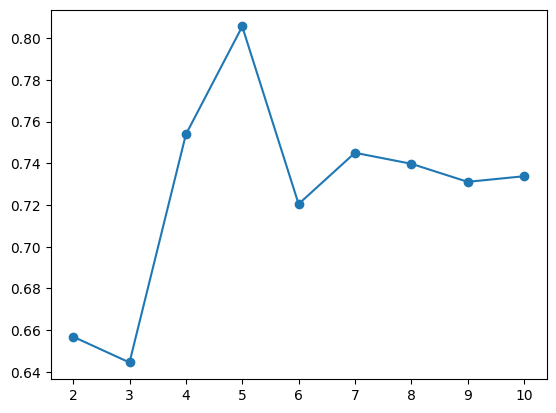

In [30]:
# parameters
best_k = 5 # centroid의 best 개수 -> elbow, 실루엣 두 방법을 비교하여 선정한다.
abnormal = 1 # 시뮬레이션에서 이상치 판독 기준 개수

# Best k 적합하기
best = KMeans(
        n_clusters = best_k,    # 클러스터 수 설정
        init="random",   # 초기 중심점을 무작위로 선택
        n_init="auto",    # k-means 알고리즘 반복 실행 횟수 설정
        random_state=42
    ).fit(use_train)

In [31]:
df_train['kmeans_5'] = best.labels_

In [32]:
df_test['kmeans_5'] = best.predict(use_test)

### 각 Stage별 새로운 Resin 값을 제시하기 위한 코드

In [33]:
## train
# Stage별 토출량, 토출 속도, 토출 소요시간 데이터
df_train['RESIN Predicted_Volume Stage1 Dam'] = df_train['DISCHARGED SPEED OF RESIN Collect Result_Dam'] * df_train['DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam']
df_train['RESIN Predicted_Volume Stage2 Dam'] = df_train['DISCHARGED SPEED OF RESIN Collect Result_Dam'] * df_train['DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam']
df_train['RESIN Predicted_Volume Stage3 Dam'] = df_train['DISCHARGED SPEED OF RESIN Collect Result_Dam'] * df_train['DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam']

# Stage별 실제 토출량과 예측 토출량의 비율(조정 계수) 계산
df_train['Stage1 Scaling_Factor'] = df_train['Dispense Volume(Stage1) Collect Result_Dam'] / df_train['RESIN Predicted_Volume Stage1 Dam']
df_train['Stage2 Scaling_Factor'] = df_train['Dispense Volume(Stage2) Collect Result_Dam'] / df_train['RESIN Predicted_Volume Stage2 Dam']
df_train['Stage3 Scaling_Factor'] = df_train['Dispense Volume(Stage3) Collect Result_Dam'] / df_train['RESIN Predicted_Volume Stage3 Dam']

# Stage별 조정된 예측 토출량 계산
df_train['RESIN Adjusted_Predicted_Volume Stage1 Dam'] = df_train['RESIN Predicted_Volume Stage1 Dam'] * df_train['Stage1 Scaling_Factor'].mean()
df_train['RESIN Adjusted_Predicted_Volume Stage2 Dam'] = df_train['RESIN Predicted_Volume Stage2 Dam'] * df_train['Stage2 Scaling_Factor'].mean()
df_train['RESIN Adjusted_Predicted_Volume Stage3 Dam'] = df_train['RESIN Predicted_Volume Stage3 Dam'] * df_train['Stage3 Scaling_Factor'].mean()

## test
# Stage별 토출량, 토출 속도, 토출 소요시간 데이터
df_test['RESIN Predicted_Volume Stage1 Dam'] = df_test['DISCHARGED SPEED OF RESIN Collect Result_Dam'] * df_test['DISCHARGED TIME OF RESIN(Stage1) Collect Result_Dam']
df_test['RESIN Predicted_Volume Stage2 Dam'] = df_test['DISCHARGED SPEED OF RESIN Collect Result_Dam'] * df_test['DISCHARGED TIME OF RESIN(Stage2) Collect Result_Dam']
df_test['RESIN Predicted_Volume Stage3 Dam'] = df_test['DISCHARGED SPEED OF RESIN Collect Result_Dam'] * df_test['DISCHARGED TIME OF RESIN(Stage3) Collect Result_Dam']

# Stage별 실제 토출량과 예측 토출량의 비율(조정 계수) 계산
df_test['Stage1 Scaling_Factor'] = df_test['Dispense Volume(Stage1) Collect Result_Dam'] / df_test['RESIN Predicted_Volume Stage1 Dam']
df_test['Stage2 Scaling_Factor'] = df_test['Dispense Volume(Stage2) Collect Result_Dam'] / df_test['RESIN Predicted_Volume Stage2 Dam']
df_test['Stage3 Scaling_Factor'] = df_test['Dispense Volume(Stage3) Collect Result_Dam'] / df_test['RESIN Predicted_Volume Stage3 Dam']

# Stage별 조정된 예측 토출량 계산
df_test['RESIN Adjusted_Predicted_Volume Stage1 Dam'] = df_test['RESIN Predicted_Volume Stage1 Dam'] * df_test['Stage1 Scaling_Factor'].mean()
df_test['RESIN Adjusted_Predicted_Volume Stage2 Dam'] = df_test['RESIN Predicted_Volume Stage2 Dam'] * df_test['Stage2 Scaling_Factor'].mean()
df_test['RESIN Adjusted_Predicted_Volume Stage3 Dam'] = df_test['RESIN Predicted_Volume Stage3 Dam'] * df_test['Stage3 Scaling_Factor'].mean()

In [34]:
## train
# Stage별 토출량, 토출 속도, 토출 소요시간 데이터
df_train['RESIN Predicted_Volume Stage1 Fill1'] = df_train['DISCHARGED SPEED OF RESIN Collect Result_Fill1'] * df_train['DISCHARGED TIME OF RESIN(Stage1) Collect Result_Fill1']
df_train['RESIN Predicted_Volume Stage2 Fill1'] = df_train['DISCHARGED SPEED OF RESIN Collect Result_Fill1'] * df_train['DISCHARGED TIME OF RESIN(Stage2) Collect Result_Fill1']
df_train['RESIN Predicted_Volume Stage3 Fill1'] = df_train['DISCHARGED SPEED OF RESIN Collect Result_Fill1'] * df_train['DISCHARGED TIME OF RESIN(Stage3) Collect Result_Fill1']

# Stage별 실제 토출량과 예측 토출량의 비율(조정 계수) 계산
df_train['Stage1 Scaling_Factor'] = df_train['Dispense Volume(Stage1) Collect Result_Fill1'] / df_train['RESIN Predicted_Volume Stage1 Fill1']
df_train['Stage2 Scaling_Factor'] = df_train['Dispense Volume(Stage2) Collect Result_Fill1'] / df_train['RESIN Predicted_Volume Stage2 Fill1']
df_train['Stage3 Scaling_Factor'] = df_train['Dispense Volume(Stage3) Collect Result_Fill1'] / df_train['RESIN Predicted_Volume Stage3 Fill1']

# Stage별 조정된 예측 토출량 계산
df_train['RESIN Adjusted_Predicted_Volume Stage1 Fill1'] = df_train['RESIN Predicted_Volume Stage1 Fill1'] * df_train['Stage1 Scaling_Factor'].mean()
df_train['RESIN Adjusted_Predicted_Volume Stage2 Fill1'] = df_train['RESIN Predicted_Volume Stage2 Fill1'] * df_train['Stage2 Scaling_Factor'].mean()
df_train['RESIN Adjusted_Predicted_Volume Stage3 Fill1'] = df_train['RESIN Predicted_Volume Stage3 Fill1'] * df_train['Stage3 Scaling_Factor'].mean()

## test
# Stage별 토출량, 토출 속도, 토출 소요시간 데이터
df_test['RESIN Predicted_Volume Stage1 Fill1'] = df_test['DISCHARGED SPEED OF RESIN Collect Result_Fill1'] * df_test['DISCHARGED TIME OF RESIN(Stage1) Collect Result_Fill1']
df_test['RESIN Predicted_Volume Stage2 Fill1'] = df_test['DISCHARGED SPEED OF RESIN Collect Result_Fill1'] * df_test['DISCHARGED TIME OF RESIN(Stage2) Collect Result_Fill1']
df_test['RESIN Predicted_Volume Stage3 Fill1'] = df_test['DISCHARGED SPEED OF RESIN Collect Result_Fill1'] * df_test['DISCHARGED TIME OF RESIN(Stage3) Collect Result_Fill1']

# Stage별 실제 토출량과 예측 토출량의 비율(조정 계수) 계산
df_test['Stage1 Scaling_Factor'] = df_test['Dispense Volume(Stage1) Collect Result_Fill1'] / df_test['RESIN Predicted_Volume Stage1 Fill1']
df_test['Stage2 Scaling_Factor'] = df_test['Dispense Volume(Stage2) Collect Result_Fill1'] / df_test['RESIN Predicted_Volume Stage2 Fill1']
df_test['Stage3 Scaling_Factor'] = df_test['Dispense Volume(Stage3) Collect Result_Fill1'] / df_test['RESIN Predicted_Volume Stage3 Fill1']

# Stage별 조정된 예측 토출량 계산
df_test['RESIN Adjusted_Predicted_Volume Stage1 Fill1'] = df_test['RESIN Predicted_Volume Stage1 Fill1'] * df_test['Stage1 Scaling_Factor'].mean()
df_test['RESIN Adjusted_Predicted_Volume Stage2 Fill1'] = df_test['RESIN Predicted_Volume Stage2 Fill1'] * df_test['Stage2 Scaling_Factor'].mean()
df_test['RESIN Adjusted_Predicted_Volume Stage3 Fill1'] = df_test['RESIN Predicted_Volume Stage3 Fill1'] * df_test['Stage3 Scaling_Factor'].mean()

### Type 수정

In [35]:
label_encoders = {}
categorical_features = ['Workorder_Dam', 'Model.Suffix_Dam']

# 시드 설정
np.random.seed(42)
for feature in categorical_features:
    le = LabelEncoder()
    df_train[feature] = le.fit_transform(df_train[feature])
    
    # 검증 데이터에 있는 새로운 값에 대해 처리
    unique_values = set(df_test[feature].unique()) - set(le.classes_)
    if unique_values:
        # 새로운 값들을 인코딩할 무작위 숫자 생성
        new_labels = np.random.randint(0, len(le.classes_), size=len(unique_values))
        # 새로운 값들을 인코딩
        le.classes_ = np.append(le.classes_, list(unique_values))
        le.transform(list(unique_values))  # transform을 호출해서 classes_ 업데이트
    
    df_test[feature] = le.transform(df_test[feature])
    label_encoders[feature] = le

### 변수 선택

In [36]:
df_train = df_train[sel_col]
df_test = df_test[sel_col]

### rename

In [37]:
# collect result 빼기
df_train.columns = df_train.columns.str.replace(' Collect Result', '')
df_test.columns = df_test.columns.str.replace(' Collect Result', '')

In [38]:
name_dic = {
    'Model.Suffix_Dam': 'Model.Suffix',
    'Workorder_Dam': 'Workorder',
    'Receip No_Dam': 'Receip',
    'Equipment_Dam': 'Equipment',
    'PalletID_Dam': 'PalletID'
}

df_train = df_train.rename(columns=name_dic)
df_test = df_test.rename(columns=name_dic)

# 이 아래부터 자유롭게 변환하여 사용하세요

## 위의 함수도 경우에 따라 자유롭게 변형해도 됩니다.

### target 0, 1 변환

In [39]:
df_train['target'] = np.where(df_train['target'] == 'Normal', 0, 1)

## 5. 데이터 학습하기


### setting

In [41]:
# 변환 리스트
columns_to_convert = [
    'Receip', 'Equipment', 'PalletID', 'Model.Suffix', 'Workorder'
]  

# 변환할 컬럼명 리스트
columns_to = [
    'Head Zero Position Y_Dam',
    'Head Zero Position Z_Dam',
    'Head Clean Position Z_Dam',
    'Head Purge Position Z_Dam',
    'Head Purge Position Z_Fill1',
    'CURE START POSITION Z_Fill2',
    'CURE END POSITION Z_Fill2',
    'CURE SPEED_Fill2',
    'Stage1 Circle1 Distance Speed_Dam',
    'Stage2 Circle1 Distance Speed_Dam',
    'Stage3 Circle1 Distance Speed_Dam',
    'Stage1 Line diffent Distance Speed_Dam',
    'Stage2 Line diffent Distance Speed_Dam',
    'Stage3 Line diffent Distance Speed_Dam',
    'kmeans_5',
    'round_1st_time',
    'round_2nd_time',
    'round_3rd_time',
    'all_time'
]

In [42]:
cat_features_indices = [
    'Receip', 'Equipment', 'PalletID', 'Model.Suffix', 'Workorder'
] + columns_to

In [43]:
# data
cat_train, cat_test = variable_setting('catboost', df_train, df_test, columns_to_convert, columns_to)
lgbm_train, lgbm_test = variable_setting('lightgbm', df_train, df_test, columns_to_convert, columns_to)
xgb_train, xgb_test = variable_setting('xgboost', df_train, df_test, columns_to_convert, columns_to)

### Best_Params 얻기

In [44]:
# optuna tuning
cat_best_params, X_cat, y_cat, cat_train_index, cat_valid_index = catboost_optuna(cat_train, cat_features_indices)

[I 2024-08-22 09:21:49,268] A new study created in memory with name: no-name-71962e37-7ccf-4800-9b7e-8ab069752ff3
[I 2024-08-22 09:22:11,839] Trial 0 finished with value: 0.20414201183431951 and parameters: {'iterations': 437, 'depth': 10, 'learning_rate': 0.15702970884055384, 'l2_leaf_reg': 5.990598257128395, 'border_count': 66, 'random_strength': 1.559945204206032, 'bagging_temperature': 0.05808361216819946, 'od_type': 'IncToDec', 'od_wait': 39, 'boosting_type': 'Plain'}. Best is trial 0 with value: 0.20414201183431951.
[I 2024-08-22 09:22:38,448] Trial 1 finished with value: 0.1621301775147929 and parameters: {'iterations': 850, 'depth': 5, 'learning_rate': 0.0035113563139704067, 'l2_leaf_reg': 1.8422110534358038, 'border_count': 100, 'random_strength': 5.247564316797622, 'bagging_temperature': 0.43194501864211576, 'od_type': 'Iter', 'od_wait': 15, 'boosting_type': 'Plain'}. Best is trial 0 with value: 0.20414201183431951.
[I 2024-08-22 09:23:56,578] Trial 2 finished with value: 0.1

[I 2024-08-22 09:35:28,034] Trial 20 finished with value: 0.15816326530612243 and parameters: {'iterations': 650, 'depth': 9, 'learning_rate': 0.002139375827140421, 'l2_leaf_reg': 5.710978542287867, 'border_count': 116, 'random_strength': 2.698897249629304, 'bagging_temperature': 0.6975883121140765, 'od_type': 'IncToDec', 'od_wait': 32, 'boosting_type': 'Plain'}. Best is trial 10 with value: 0.20902090209020902.
[I 2024-08-22 09:37:01,577] Trial 21 finished with value: 0.2050163576881134 and parameters: {'iterations': 816, 'depth': 10, 'learning_rate': 0.024946235324190776, 'l2_leaf_reg': 9.92929267264672, 'border_count': 137, 'random_strength': 1.918616505223317, 'bagging_temperature': 0.9717296767001113, 'od_type': 'IncToDec', 'od_wait': 41, 'boosting_type': 'Plain'}. Best is trial 10 with value: 0.20902090209020902.
[I 2024-08-22 09:38:33,001] Trial 22 finished with value: 0.1970802919708029 and parameters: {'iterations': 914, 'depth': 10, 'learning_rate': 0.015082017061736203, 'l2_

[I 2024-08-22 09:55:52,552] Trial 40 finished with value: 0.1862980769230769 and parameters: {'iterations': 898, 'depth': 6, 'learning_rate': 0.09721262531146041, 'l2_leaf_reg': 7.526605442849155, 'border_count': 75, 'random_strength': 0.12640199605696445, 'bagging_temperature': 0.9629282498252991, 'od_type': 'IncToDec', 'od_wait': 32, 'boosting_type': 'Plain'}. Best is trial 31 with value: 0.2096317280453258.
[I 2024-08-22 09:57:02,278] Trial 41 finished with value: 0.20757020757020755 and parameters: {'iterations': 817, 'depth': 10, 'learning_rate': 0.03744821272930535, 'l2_leaf_reg': 9.574881196179845, 'border_count': 175, 'random_strength': 3.6243012788966604, 'bagging_temperature': 0.5639259933510692, 'od_type': 'IncToDec', 'od_wait': 43, 'boosting_type': 'Plain'}. Best is trial 31 with value: 0.2096317280453258.
[I 2024-08-22 09:57:57,442] Trial 42 finished with value: 0.1959412176347096 and parameters: {'iterations': 521, 'depth': 10, 'learning_rate': 0.03132774540840559, 'l2_le

Best trial:
  Value: 0.2096317280453258
  Params: 
    iterations: 799
    depth: 10
    learning_rate: 0.026594791573140143
    l2_leaf_reg: 9.90528326912276
    border_count: 133
    random_strength: 1.6896453654965482
    bagging_temperature: 0.9336163483106121
    od_type: IncToDec
    od_wait: 41
    boosting_type: Plain


In [45]:
# optuna tuning
lgbm_best_params, X_lgbm, y_lgbm, lgbm_train_index, lgbm_valid_index = lightgbm_optuna(lgbm_train, cat_features_indices)

[I 2024-08-22 10:02:51,554] A new study created in memory with name: no-name-0760561f-f580-4bae-bb1c-a080e88a3a3d


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 10:02:54,428] Trial 0 finished with value: 0.19649122807017544 and parameters: {'n_estimators': 812, 'max_depth': 60, 'learning_rate': 0.0029106359131330704, 'reg_alpha': 0.24810409748678125, 'reg_lambda': 0.004207988669606638, 'min_child_weight': 1.0459808211767092, 'min_child_samples': 10, 'subsample': 0.9197056874649611, 'subsample_freq': 3, 'colsample_bytree': 0.7664580622368364, 'num_leaves': 3}. Best is trial 0 with value: 0.19649122807017544.


Did not meet early stopping. Best iteration is:
[812]	valid_0's binary_logloss: 0.210121
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1467]	valid_0's binary_logloss: 0.213612


[I 2024-08-22 10:02:58,076] Trial 1 finished with value: 0.19305555555555554 and parameters: {'n_estimators': 1467, 'max_depth': 53, 'learning_rate': 0.00026587543983272726, 'reg_alpha': 0.005337032762603957, 'reg_lambda': 0.00541524411940254, 'min_child_weight': 1.564847850358382, 'min_child_samples': 55, 'subsample': 0.6591670111852694, 'subsample_freq': 1, 'colsample_bytree': 0.6894823157779035, 'num_leaves': 10}. Best is trial 0 with value: 0.19649122807017544.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 10:02:59,801] Trial 2 finished with value: 0.16666666666666669 and parameters: {'n_estimators': 721, 'max_depth': 25, 'learning_rate': 0.000816845589476017, 'reg_alpha': 1.382623217936987, 'reg_lambda': 0.006290644294586149, 'min_child_weight': 2.2998205344476403, 'min_child_samples': 61, 'subsample': 0.42787024763199866, 'subsample_freq': 3, 'colsample_bytree': 0.33641929894983325, 'num_leaves': 6}. Best is trial 0 with value: 0.19649122807017544.


Did not meet early stopping. Best iteration is:
[721]	valid_0's binary_logloss: 0.216749
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[878]	valid_0's binary_logloss: 0.207754


[I 2024-08-22 10:03:04,041] Trial 3 finished with value: 0.22243713733075438 and parameters: {'n_estimators': 1444, 'max_depth': 61, 'learning_rate': 0.004138040112561018, 'reg_alpha': 0.01653693718282442, 'reg_lambda': 0.002458603276328005, 'min_child_weight': 2.894815592792549, 'min_child_samples': 47, 'subsample': 0.47322294090686734, 'subsample_freq': 2, 'colsample_bytree': 0.22751081689217473, 'num_leaves': 59}. Best is trial 3 with value: 0.22243713733075438.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[684]	valid_0's binary_logloss: 0.215521


[I 2024-08-22 10:03:07,405] Trial 4 finished with value: 0.19758351101634686 and parameters: {'n_estimators': 684, 'max_depth': 43, 'learning_rate': 0.0004201672054372534, 'reg_alpha': 0.12030178871154672, 'reg_lambda': 0.1537592023548176, 'min_child_weight': 1.1469905943393446, 'min_child_samples': 98, 'subsample': 0.8650796940166687, 'subsample_freq': 5, 'colsample_bytree': 0.915861880342119, 'num_leaves': 39}. Best is trial 3 with value: 0.22243713733075438.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1414]	valid_0's binary_logloss: 0.213852


[I 2024-08-22 10:03:14,588] Trial 5 finished with value: 0.2067553735926305 and parameters: {'n_estimators': 1414, 'max_depth': 8, 'learning_rate': 0.0002465844721448739, 'reg_alpha': 0.0015167330688076208, 'reg_lambda': 0.02001342062287998, 'min_child_weight': 1.860370513913187, 'min_child_samples': 31, 'subsample': 0.8972425054911576, 'subsample_freq': 2, 'colsample_bytree': 0.4247476077499046, 'num_leaves': 36}. Best is trial 3 with value: 0.22243713733075438.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[555]	valid_0's binary_logloss: 0.219197


[I 2024-08-22 10:03:17,583] Trial 6 finished with value: 0.19035997559487491 and parameters: {'n_estimators': 555, 'max_depth': 51, 'learning_rate': 0.00014096175149815865, 'reg_alpha': 8.862326508576253, 'reg_lambda': 1.2273800987852967, 'min_child_weight': 1.1955048853696035, 'min_child_samples': 5, 'subsample': 0.8892768570729005, 'subsample_freq': 4, 'colsample_bytree': 0.7832057344327898, 'num_leaves': 50}. Best is trial 3 with value: 0.22243713733075438.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 10:03:19,537] Trial 7 finished with value: 0.1911667765326302 and parameters: {'n_estimators': 481, 'max_depth': 24, 'learning_rate': 0.0001705053926026929, 'reg_alpha': 2.8340904295147746, 'reg_lambda': 0.3113095956122124, 'min_child_weight': 1.6581430869842722, 'min_child_samples': 11, 'subsample': 0.5865893930293973, 'subsample_freq': 1, 'colsample_bytree': 0.7836849426704513, 'num_leaves': 42}. Best is trial 3 with value: 0.22243713733075438.


Did not meet early stopping. Best iteration is:
[481]	valid_0's binary_logloss: 0.218733
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 10:03:23,192] Trial 8 finished with value: 0.1818181818181818 and parameters: {'n_estimators': 1376, 'max_depth': 31, 'learning_rate': 0.00017345566642360953, 'reg_alpha': 0.7128188058401367, 'reg_lambda': 1.1044350847124695, 'min_child_weight': 2.4644701914932368, 'min_child_samples': 79, 'subsample': 0.6962773578186345, 'subsample_freq': 3, 'colsample_bytree': 0.5420328146868397, 'num_leaves': 3}. Best is trial 3 with value: 0.22243713733075438.


Did not meet early stopping. Best iteration is:
[1376]	valid_0's binary_logloss: 0.219115
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 10:03:24,691] Trial 9 finished with value: 0.18604651162790697 and parameters: {'n_estimators': 518, 'max_depth': 4, 'learning_rate': 0.0018742210985555703, 'reg_alpha': 0.018089390092767135, 'reg_lambda': 0.1082138291061399, 'min_child_weight': 3.6764826587413255, 'min_child_samples': 28, 'subsample': 0.6462297538213778, 'subsample_freq': 4, 'colsample_bytree': 0.383038532393298, 'num_leaves': 6}. Best is trial 3 with value: 0.22243713733075438.


Did not meet early stopping. Best iteration is:
[518]	valid_0's binary_logloss: 0.21268
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 10:03:26,938] Trial 10 finished with value: 0.2294172062904718 and parameters: {'n_estimators': 1123, 'max_depth': 44, 'learning_rate': 0.008691089486124973, 'reg_alpha': 0.024400771927662202, 'reg_lambda': 0.0011447070776131048, 'min_child_weight': 3.2574490847879742, 'min_child_samples': 39, 'subsample': 0.40669661435551696, 'subsample_freq': 0, 'colsample_bytree': 0.20984893565195006, 'num_leaves': 64}. Best is trial 10 with value: 0.2294172062904718.


Early stopping, best iteration is:
[416]	valid_0's binary_logloss: 0.205802
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 10:03:28,996] Trial 11 finished with value: 0.2232223222322232 and parameters: {'n_estimators': 1142, 'max_depth': 42, 'learning_rate': 0.009588418536116118, 'reg_alpha': 0.02344574163871334, 'reg_lambda': 0.0011066835670797846, 'min_child_weight': 3.228664519418552, 'min_child_samples': 38, 'subsample': 0.4047844499396721, 'subsample_freq': 0, 'colsample_bytree': 0.2484675793960146, 'num_leaves': 64}. Best is trial 10 with value: 0.2294172062904718.


Early stopping, best iteration is:
[365]	valid_0's binary_logloss: 0.205368
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 10:03:30,811] Trial 12 finished with value: 0.22305529522024364 and parameters: {'n_estimators': 1103, 'max_depth': 40, 'learning_rate': 0.009613909972104616, 'reg_alpha': 0.04481839128894382, 'reg_lambda': 0.001029636908767823, 'min_child_weight': 3.6985293534389845, 'min_child_samples': 37, 'subsample': 0.5126396185753415, 'subsample_freq': 0, 'colsample_bytree': 0.20362083825494987, 'num_leaves': 62}. Best is trial 10 with value: 0.2294172062904718.


Early stopping, best iteration is:
[320]	valid_0's binary_logloss: 0.205894
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 10:03:32,517] Trial 13 finished with value: 0.2127659574468085 and parameters: {'n_estimators': 1120, 'max_depth': 40, 'learning_rate': 0.009951044619173715, 'reg_alpha': 0.004266587910190727, 'reg_lambda': 7.266943511144061, 'min_child_weight': 3.119707737904152, 'min_child_samples': 67, 'subsample': 0.4170938644683172, 'subsample_freq': 0, 'colsample_bytree': 0.53216529309064, 'num_leaves': 22}. Best is trial 10 with value: 0.2294172062904718.


Early stopping, best iteration is:
[311]	valid_0's binary_logloss: 0.207721
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[661]	valid_0's binary_logloss: 0.205541


[I 2024-08-22 10:03:35,877] Trial 14 finished with value: 0.22590068159688412 and parameters: {'n_estimators': 1176, 'max_depth': 49, 'learning_rate': 0.004973541716877472, 'reg_alpha': 0.04358090917703344, 'reg_lambda': 0.03132642408656095, 'min_child_weight': 3.1616848374638136, 'min_child_samples': 43, 'subsample': 0.5388818879978657, 'subsample_freq': 0, 'colsample_bytree': 0.29578283133055705, 'num_leaves': 52}. Best is trial 10 with value: 0.2294172062904718.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[550]	valid_0's binary_logloss: 0.207331


[I 2024-08-22 10:03:39,075] Trial 15 finished with value: 0.21435059037238874 and parameters: {'n_estimators': 957, 'max_depth': 51, 'learning_rate': 0.0046043509881095335, 'reg_alpha': 0.1778490002051104, 'reg_lambda': 0.02855937068226843, 'min_child_weight': 3.957633996251157, 'min_child_samples': 23, 'subsample': 0.5467216284935695, 'subsample_freq': 1, 'colsample_bytree': 0.43439298213168176, 'num_leaves': 52}. Best is trial 10 with value: 0.2294172062904718.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1255]	valid_0's binary_logloss: 0.20744


[I 2024-08-22 10:03:45,099] Trial 16 finished with value: 0.21120689655172412 and parameters: {'n_estimators': 1256, 'max_depth': 33, 'learning_rate': 0.0012027906411716696, 'reg_alpha': 0.051684434759865, 'reg_lambda': 0.021443548352303755, 'min_child_weight': 2.733695028537947, 'min_child_samples': 46, 'subsample': 0.8006754697504556, 'subsample_freq': 1, 'colsample_bytree': 0.31293543211040964, 'num_leaves': 51}. Best is trial 10 with value: 0.2294172062904718.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 10:03:47,230] Trial 17 finished with value: 0.20729684908789386 and parameters: {'n_estimators': 952, 'max_depth': 14, 'learning_rate': 0.005884144791687234, 'reg_alpha': 0.006737358642745858, 'reg_lambda': 0.04133206909441451, 'min_child_weight': 0.542895712277309, 'min_child_samples': 70, 'subsample': 0.9947663176861599, 'subsample_freq': 0, 'colsample_bytree': 0.49979292354263916, 'num_leaves': 26}. Best is trial 10 with value: 0.2294172062904718.


Early stopping, best iteration is:
[413]	valid_0's binary_logloss: 0.206885
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1232]	valid_0's binary_logloss: 0.206687


[I 2024-08-22 10:03:53,295] Trial 18 finished with value: 0.2193158953722334 and parameters: {'n_estimators': 1232, 'max_depth': 47, 'learning_rate': 0.002006032740306424, 'reg_alpha': 0.001058427819837614, 'reg_lambda': 0.012540311943291471, 'min_child_weight': 3.384158562531583, 'min_child_samples': 23, 'subsample': 0.5889387797811585, 'subsample_freq': 2, 'colsample_bytree': 0.29902874321501566, 'num_leaves': 55}. Best is trial 10 with value: 0.2294172062904718.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 10:03:54,816] Trial 19 finished with value: 0.21268656716417908 and parameters: {'n_estimators': 1019, 'max_depth': 24, 'learning_rate': 0.0056760760560819615, 'reg_alpha': 0.637365735518874, 'reg_lambda': 0.6326322581799338, 'min_child_weight': 2.5909059981343057, 'min_child_samples': 84, 'subsample': 0.49942187300528806, 'subsample_freq': 0, 'colsample_bytree': 0.9550926416247638, 'num_leaves': 45}. Best is trial 10 with value: 0.2294172062904718.


Early stopping, best iteration is:
[244]	valid_0's binary_logloss: 0.210719
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[833]	valid_0's binary_logloss: 0.210968


[I 2024-08-22 10:03:57,894] Trial 20 finished with value: 0.20557491289198604 and parameters: {'n_estimators': 833, 'max_depth': 54, 'learning_rate': 0.0006747716169120554, 'reg_alpha': 0.06273452264824793, 'reg_lambda': 0.053876546774528224, 'min_child_weight': 3.012978855185204, 'min_child_samples': 50, 'subsample': 0.7465548799232171, 'subsample_freq': 1, 'colsample_bytree': 0.6717766953364164, 'num_leaves': 30}. Best is trial 10 with value: 0.2294172062904718.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[474]	valid_0's binary_logloss: 0.205492


[I 2024-08-22 10:04:00,501] Trial 21 finished with value: 0.2224770642201835 and parameters: {'n_estimators': 1272, 'max_depth': 45, 'learning_rate': 0.007384032597635914, 'reg_alpha': 0.024258620126805363, 'reg_lambda': 0.0013580700166869236, 'min_child_weight': 3.2264784424750865, 'min_child_samples': 39, 'subsample': 0.4037914642523681, 'subsample_freq': 0, 'colsample_bytree': 0.2642298840435963, 'num_leaves': 64}. Best is trial 10 with value: 0.2294172062904718.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1130]	valid_0's binary_logloss: 0.205438


[I 2024-08-22 10:04:05,641] Trial 22 finished with value: 0.22586520947176686 and parameters: {'n_estimators': 1130, 'max_depth': 38, 'learning_rate': 0.002835955977102825, 'reg_alpha': 0.007417804621233496, 'reg_lambda': 0.0026161640114950964, 'min_child_weight': 3.460920436618997, 'min_child_samples': 38, 'subsample': 0.4629342233157273, 'subsample_freq': 0, 'colsample_bytree': 0.21111804654321326, 'num_leaves': 58}. Best is trial 10 with value: 0.2294172062904718.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1060]	valid_0's binary_logloss: 0.207544


[I 2024-08-22 10:04:11,245] Trial 23 finished with value: 0.2153558052434457 and parameters: {'n_estimators': 1066, 'max_depth': 36, 'learning_rate': 0.002944033715733111, 'reg_alpha': 0.009837949613203155, 'reg_lambda': 0.009585986410727282, 'min_child_weight': 3.54388984202483, 'min_child_samples': 56, 'subsample': 0.4692273308595454, 'subsample_freq': 1, 'colsample_bytree': 0.3554751715682351, 'num_leaves': 57}. Best is trial 10 with value: 0.2294172062904718.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[931]	valid_0's binary_logloss: 0.205707


[I 2024-08-22 10:04:15,492] Trial 24 finished with value: 0.23614895549500456 and parameters: {'n_estimators': 1200, 'max_depth': 35, 'learning_rate': 0.0033915034919078995, 'reg_alpha': 0.003219099570238166, 'reg_lambda': 0.0027227863051692046, 'min_child_weight': 3.866826503425987, 'min_child_samples': 19, 'subsample': 0.5622786679912821, 'subsample_freq': 0, 'colsample_bytree': 0.2017923311923203, 'num_leaves': 46}. Best is trial 24 with value: 0.23614895549500456.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1341]	valid_0's binary_logloss: 0.205858


[I 2024-08-22 10:04:22,036] Trial 25 finished with value: 0.2230151650312221 and parameters: {'n_estimators': 1341, 'max_depth': 30, 'learning_rate': 0.001588106287163536, 'reg_alpha': 0.0027419300990706164, 'reg_lambda': 0.0027382683167750787, 'min_child_weight': 3.850751433605258, 'min_child_samples': 17, 'subsample': 0.590241108907767, 'subsample_freq': 0, 'colsample_bytree': 0.4362087233041451, 'num_leaves': 45}. Best is trial 24 with value: 0.23614895549500456.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[1053]	valid_0's binary_logloss: 0.207149


[I 2024-08-22 10:04:27,182] Trial 26 finished with value: 0.22695035460992907 and parameters: {'n_estimators': 1223, 'max_depth': 57, 'learning_rate': 0.0038972767324750813, 'reg_alpha': 0.0025996262052871023, 'reg_lambda': 0.011939634253075765, 'min_child_weight': 3.950038773801772, 'min_child_samples': 19, 'subsample': 0.5430092606364327, 'subsample_freq': 1, 'colsample_bytree': 0.27519723638265614, 'num_leaves': 47}. Best is trial 24 with value: 0.23614895549500456.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[932]	valid_0's binary_logloss: 0.206624


[I 2024-08-22 10:04:31,317] Trial 27 finished with value: 0.22445255474452555 and parameters: {'n_estimators': 1308, 'max_depth': 58, 'learning_rate': 0.0036991915300705245, 'reg_alpha': 0.001810874736447241, 'reg_lambda': 0.010803504169238335, 'min_child_weight': 3.92102851518843, 'min_child_samples': 19, 'subsample': 0.6522327450870664, 'subsample_freq': 1, 'colsample_bytree': 0.2001832811551461, 'num_leaves': 33}. Best is trial 24 with value: 0.23614895549500456.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 10:04:33,517] Trial 28 finished with value: 0.21031746031746035 and parameters: {'n_estimators': 1183, 'max_depth': 57, 'learning_rate': 0.006509403611330576, 'reg_alpha': 0.0030083120739477867, 'reg_lambda': 0.0019206080090431242, 'min_child_weight': 3.985661834515166, 'min_child_samples': 29, 'subsample': 0.5608245672501185, 'subsample_freq': 2, 'colsample_bytree': 0.3848366313796944, 'num_leaves': 18}. Best is trial 24 with value: 0.23614895549500456.


Early stopping, best iteration is:
[525]	valid_0's binary_logloss: 0.207818
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[863]	valid_0's binary_logloss: 0.207316


[I 2024-08-22 10:04:37,507] Trial 29 finished with value: 0.21408450704225354 and parameters: {'n_estimators': 863, 'max_depth': 20, 'learning_rate': 0.0026102637216286056, 'reg_alpha': 0.011402630447561986, 'reg_lambda': 0.0039127316635107585, 'min_child_weight': 3.6578440602762363, 'min_child_samples': 9, 'subsample': 0.6137646729312181, 'subsample_freq': 1, 'colsample_bytree': 0.2668672935914487, 'num_leaves': 46}. Best is trial 24 with value: 0.23614895549500456.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1059]	valid_0's binary_logloss: 0.207432


[I 2024-08-22 10:04:43,055] Trial 30 finished with value: 0.21052631578947367 and parameters: {'n_estimators': 1059, 'max_depth': 63, 'learning_rate': 0.0012257365741945542, 'reg_alpha': 0.002283040599737261, 'reg_lambda': 0.006441025093821556, 'min_child_weight': 2.8337083885614707, 'min_child_samples': 15, 'subsample': 0.7293554512384417, 'subsample_freq': 2, 'colsample_bytree': 0.4697712640468825, 'num_leaves': 40}. Best is trial 24 with value: 0.23614895549500456.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[661]	valid_0's binary_logloss: 0.20559


[I 2024-08-22 10:04:46,419] Trial 31 finished with value: 0.2305630026809651 and parameters: {'n_estimators': 1187, 'max_depth': 48, 'learning_rate': 0.004683475577621404, 'reg_alpha': 0.328830366774475, 'reg_lambda': 0.004055879518339791, 'min_child_weight': 3.3922685487442967, 'min_child_samples': 43, 'subsample': 0.5236685009546862, 'subsample_freq': 0, 'colsample_bytree': 0.28964729702754943, 'num_leaves': 53}. Best is trial 24 with value: 0.23614895549500456.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[960]	valid_0's binary_logloss: 0.205376


[I 2024-08-22 10:04:50,976] Trial 32 finished with value: 0.2336448598130841 and parameters: {'n_estimators': 1499, 'max_depth': 56, 'learning_rate': 0.0035734346167732903, 'reg_alpha': 0.25857080570409696, 'reg_lambda': 0.003743706037224895, 'min_child_weight': 3.358656749364982, 'min_child_samples': 32, 'subsample': 0.5136168704410008, 'subsample_freq': 0, 'colsample_bytree': 0.2713145705100898, 'num_leaves': 47}. Best is trial 24 with value: 0.23614895549500456.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 10:04:53,236] Trial 33 finished with value: 0.22284644194756553 and parameters: {'n_estimators': 1488, 'max_depth': 45, 'learning_rate': 0.007811941935303318, 'reg_alpha': 0.2859318906462174, 'reg_lambda': 0.0046626341776006145, 'min_child_weight': 3.4093357358955645, 'min_child_samples': 33, 'subsample': 0.4622447461807139, 'subsample_freq': 0, 'colsample_bytree': 0.34946836527324426, 'num_leaves': 55}. Best is trial 24 with value: 0.23614895549500456.


Early stopping, best iteration is:
[399]	valid_0's binary_logloss: 0.205382
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[992]	valid_0's binary_logloss: 0.20611


[I 2024-08-22 10:04:58,210] Trial 34 finished with value: 0.22627737226277372 and parameters: {'n_estimators': 992, 'max_depth': 55, 'learning_rate': 0.0024238831984047136, 'reg_alpha': 0.27021225452635156, 'reg_lambda': 0.0036986027524667005, 'min_child_weight': 3.339506081468647, 'min_child_samples': 60, 'subsample': 0.5109392785331865, 'subsample_freq': 0, 'colsample_bytree': 0.32642659095153687, 'num_leaves': 60}. Best is trial 24 with value: 0.23614895549500456.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[878]	valid_0's binary_logloss: 0.206942


[I 2024-08-22 10:05:02,209] Trial 35 finished with value: 0.22518765638031693 and parameters: {'n_estimators': 878, 'max_depth': 36, 'learning_rate': 0.0033365990449562995, 'reg_alpha': 0.5072131745905116, 'reg_lambda': 0.0018342308007991911, 'min_child_weight': 2.056634106659138, 'min_child_samples': 25, 'subsample': 0.4441761295953323, 'subsample_freq': 1, 'colsample_bytree': 0.24324358754569358, 'num_leaves': 49}. Best is trial 24 with value: 0.23614895549500456.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 10:05:04,135] Trial 36 finished with value: 0.2059447983014862 and parameters: {'n_estimators': 1412, 'max_depth': 49, 'learning_rate': 0.004850679538199898, 'reg_alpha': 0.11767704544851348, 'reg_lambda': 0.006769237481744073, 'min_child_weight': 2.922923447031378, 'min_child_samples': 52, 'subsample': 0.49279821149521014, 'subsample_freq': 0, 'colsample_bytree': 0.6499583189231987, 'num_leaves': 38}. Best is trial 24 with value: 0.23614895549500456.


Early stopping, best iteration is:
[396]	valid_0's binary_logloss: 0.206785
Training until validation scores don't improve for 50 rounds


[I 2024-08-22 10:05:06,217] Trial 37 finished with value: 0.20776699029126214 and parameters: {'n_estimators': 731, 'max_depth': 28, 'learning_rate': 0.007283090980705402, 'reg_alpha': 1.5873700345838677, 'reg_lambda': 0.0016354378626166697, 'min_child_weight': 2.329607416538283, 'min_child_samples': 44, 'subsample': 0.6151993573062382, 'subsample_freq': 5, 'colsample_bytree': 0.8755337244453544, 'num_leaves': 42}. Best is trial 24 with value: 0.23614895549500456.


Early stopping, best iteration is:
[375]	valid_0's binary_logloss: 0.20831
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1322]	valid_0's binary_logloss: 0.206019


[I 2024-08-22 10:05:12,766] Trial 38 finished with value: 0.2288828337874659 and parameters: {'n_estimators': 1322, 'max_depth': 52, 'learning_rate': 0.0015919042979962838, 'reg_alpha': 0.09325405266267182, 'reg_lambda': 0.0030727910879580923, 'min_child_weight': 3.6160940856353805, 'min_child_samples': 36, 'subsample': 0.44791966095656893, 'subsample_freq': 0, 'colsample_bytree': 0.37640263636860594, 'num_leaves': 54}. Best is trial 24 with value: 0.23614895549500456.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1438]	valid_0's binary_logloss: 0.209857


[I 2024-08-22 10:05:19,615] Trial 39 finished with value: 0.21074815595363544 and parameters: {'n_estimators': 1438, 'max_depth': 60, 'learning_rate': 0.0007487197258010771, 'reg_alpha': 0.39513695085696277, 'reg_lambda': 0.006186356850177313, 'min_child_weight': 2.653914887215533, 'min_child_samples': 32, 'subsample': 0.6771539336584766, 'subsample_freq': 4, 'colsample_bytree': 0.2403446291734415, 'num_leaves': 60}. Best is trial 24 with value: 0.23614895549500456.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 10:05:21,286] Trial 40 finished with value: 0.1688086141021188 and parameters: {'n_estimators': 411, 'max_depth': 44, 'learning_rate': 0.000488043663911623, 'reg_alpha': 1.0854072701323316, 'reg_lambda': 7.394225680642376, 'min_child_weight': 3.790183400276813, 'min_child_samples': 100, 'subsample': 0.51804250313495, 'subsample_freq': 3, 'colsample_bytree': 0.32146198792004776, 'num_leaves': 34}. Best is trial 24 with value: 0.23614895549500456.


Did not meet early stopping. Best iteration is:
[411]	valid_0's binary_logloss: 0.219279
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1329]	valid_0's binary_logloss: 0.205619


[I 2024-08-22 10:05:28,012] Trial 41 finished with value: 0.22310756972111553 and parameters: {'n_estimators': 1344, 'max_depth': 52, 'learning_rate': 0.0020705393213087393, 'reg_alpha': 0.08839736795352612, 'reg_lambda': 0.0032875784526028027, 'min_child_weight': 3.5987996681798493, 'min_child_samples': 34, 'subsample': 0.4338540311996557, 'subsample_freq': 0, 'colsample_bytree': 0.3926575149707292, 'num_leaves': 55}. Best is trial 24 with value: 0.23614895549500456.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1284]	valid_0's binary_logloss: 0.206309


[I 2024-08-22 10:05:34,813] Trial 42 finished with value: 0.2203913491246138 and parameters: {'n_estimators': 1312, 'max_depth': 48, 'learning_rate': 0.0014907566494722193, 'reg_alpha': 0.16174103086653574, 'reg_lambda': 0.0021447998633068533, 'min_child_weight': 3.4863892944999835, 'min_child_samples': 43, 'subsample': 0.44219479014164453, 'subsample_freq': 0, 'colsample_bytree': 0.5959753769602312, 'num_leaves': 54}. Best is trial 24 with value: 0.23614895549500456.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[965]	valid_0's binary_logloss: 0.205257


[I 2024-08-22 10:05:39,416] Trial 43 finished with value: 0.23069207622868607 and parameters: {'n_estimators': 1489, 'max_depth': 53, 'learning_rate': 0.003386309016983334, 'reg_alpha': 0.07837490409846258, 'reg_lambda': 0.001205890906346745, 'min_child_weight': 3.0356840216485486, 'min_child_samples': 27, 'subsample': 0.48374656608262184, 'subsample_freq': 0, 'colsample_bytree': 0.2853541881901693, 'num_leaves': 48}. Best is trial 24 with value: 0.23614895549500456.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[738]	valid_0's binary_logloss: 0.207152


[I 2024-08-22 10:05:43,296] Trial 44 finished with value: 0.21863117870722434 and parameters: {'n_estimators': 1396, 'max_depth': 41, 'learning_rate': 0.003963670670601901, 'reg_alpha': 0.028753733741098873, 'reg_lambda': 0.0011288359402886882, 'min_child_weight': 3.04259385009114, 'min_child_samples': 27, 'subsample': 0.4956929085365325, 'subsample_freq': 1, 'colsample_bytree': 0.2830200458874828, 'num_leaves': 48}. Best is trial 24 with value: 0.23614895549500456.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[1150]	valid_0's binary_logloss: 0.206493


[I 2024-08-22 10:05:48,462] Trial 45 finished with value: 0.22661870503597123 and parameters: {'n_estimators': 1463, 'max_depth': 55, 'learning_rate': 0.0033052400391964973, 'reg_alpha': 3.386389413731475, 'reg_lambda': 0.0010762217335193022, 'min_child_weight': 3.2767902975613383, 'min_child_samples': 12, 'subsample': 0.5622441000005509, 'subsample_freq': 0, 'colsample_bytree': 0.22577874115453334, 'num_leaves': 42}. Best is trial 24 with value: 0.23614895549500456.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[647]	valid_0's binary_logloss: 0.207276


[I 2024-08-22 10:05:51,693] Trial 46 finished with value: 0.2181818181818182 and parameters: {'n_estimators': 1500, 'max_depth': 46, 'learning_rate': 0.005011819269684245, 'reg_alpha': 0.1806438576767109, 'reg_lambda': 0.0017058375193186232, 'min_child_weight': 2.8728456462940724, 'min_child_samples': 6, 'subsample': 0.4859635283870048, 'subsample_freq': 1, 'colsample_bytree': 0.24161419091432568, 'num_leaves': 43}. Best is trial 24 with value: 0.23614895549500456.


Training until validation scores don't improve for 50 rounds


[I 2024-08-22 10:05:54,067] Trial 47 finished with value: 0.22560975609756098 and parameters: {'n_estimators': 1188, 'max_depth': 35, 'learning_rate': 0.008509710306511039, 'reg_alpha': 0.03490467646291566, 'reg_lambda': 3.2857874500478315, 'min_child_weight': 3.7692590614859416, 'min_child_samples': 41, 'subsample': 0.5266059210525564, 'subsample_freq': 0, 'colsample_bytree': 0.3440377046349765, 'num_leaves': 61}. Best is trial 24 with value: 0.23614895549500456.


Early stopping, best iteration is:
[402]	valid_0's binary_logloss: 0.20622
Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[527]	valid_0's binary_logloss: 0.205142


[I 2024-08-22 10:05:56,754] Trial 48 finished with value: 0.22507403751233956 and parameters: {'n_estimators': 1370, 'max_depth': 50, 'learning_rate': 0.006293789149955009, 'reg_alpha': 0.015920976012069588, 'reg_lambda': 0.01721424229715802, 'min_child_weight': 3.1193613237833917, 'min_child_samples': 21, 'subsample': 0.6173688318559066, 'subsample_freq': 0, 'colsample_bytree': 0.2933175731264738, 'num_leaves': 51}. Best is trial 24 with value: 0.23614895549500456.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[845]	valid_0's binary_logloss: 0.207524


[I 2024-08-22 10:06:00,395] Trial 49 finished with value: 0.21758839528558474 and parameters: {'n_estimators': 1271, 'max_depth': 60, 'learning_rate': 0.004256083673113503, 'reg_alpha': 0.06778218377306049, 'reg_lambda': 0.07988617929462297, 'min_child_weight': 1.5877644182901478, 'min_child_samples': 49, 'subsample': 0.4171334933409988, 'subsample_freq': 1, 'colsample_bytree': 0.20669232630073897, 'num_leaves': 38}. Best is trial 24 with value: 0.23614895549500456.


Best trial:
  Value: 0.23614895549500456
  Params: 
    n_estimators: 1200
    max_depth: 35
    learning_rate: 0.0033915034919078995
    reg_alpha: 0.003219099570238166
    reg_lambda: 0.0027227863051692046
    min_child_weight: 3.866826503425987
    min_child_samples: 19
    subsample: 0.5622786679912821
    subsample_freq: 0
    colsample_bytree: 0.2017923311923203
    num_leaves: 46


In [46]:
# optuna tuning
xgb_best_params, X_xgb, y_xgb, xgb_train_index, xgb_valid_index = xgboost_optuna(xgb_train, cat_features_indices)

[I 2024-08-22 10:06:00,420] A new study created in memory with name: no-name-ae9e32b3-4d53-400f-952e-c24a927bcd4f
[I 2024-08-22 10:06:01,267] Trial 0 finished with value: 0.22574955908289243 and parameters: {'n_estimators': 437, 'max_depth': 10, 'learning_rate': 0.15702970884055384, 'subsample': 0.7993292420985183, 'colsample_bytree': 0.5780093202212182, 'gamma': 0.7799726016810132, 'lambda': 0.0017073967431528124, 'alpha': 2.9154431891537547}. Best is trial 0 with value: 0.22574955908289243.
[I 2024-08-22 10:06:07,036] Trial 1 finished with value: 0.20448877805486285 and parameters: {'n_estimators': 641, 'max_depth': 8, 'learning_rate': 0.00115279871282324, 'subsample': 0.9849549260809971, 'colsample_bytree': 0.9162213204002109, 'gamma': 1.0616955533913808, 'lambda': 0.005337032762603957, 'alpha': 0.00541524411940254}. Best is trial 0 with value: 0.22574955908289243.
[I 2024-08-22 10:06:08,878] Trial 2 finished with value: 0.22678396871945258 and parameters: {'n_estimators': 374, 'max

[I 2024-08-22 10:06:45,821] Trial 22 finished with value: 0.20518358531317493 and parameters: {'n_estimators': 542, 'max_depth': 9, 'learning_rate': 0.08240550679761982, 'subsample': 0.8149271154876797, 'colsample_bytree': 0.5816705204349966, 'gamma': 0.7869733259631035, 'lambda': 0.0030586841642905667, 'alpha': 7.829185157764673}. Best is trial 17 with value: 0.2311111111111111.
[I 2024-08-22 10:06:46,591] Trial 23 finished with value: 0.20053238686779057 and parameters: {'n_estimators': 428, 'max_depth': 10, 'learning_rate': 0.3095127444116826, 'subsample': 0.7856896967423811, 'colsample_bytree': 0.6405078899088029, 'gamma': 0.7037536759565671, 'lambda': 0.06796365835731238, 'alpha': 0.06488262945328005}. Best is trial 17 with value: 0.2311111111111111.
[I 2024-08-22 10:06:48,574] Trial 24 finished with value: 0.22797927461139897 and parameters: {'n_estimators': 329, 'max_depth': 8, 'learning_rate': 0.01899820236473001, 'subsample': 0.8312712399145312, 'colsample_bytree': 0.535321557

[I 2024-08-22 10:07:26,424] Trial 44 finished with value: 0.20707070707070707 and parameters: {'n_estimators': 339, 'max_depth': 9, 'learning_rate': 0.03143645482490943, 'subsample': 0.7913752439807145, 'colsample_bytree': 0.5007250058963767, 'gamma': 0.5599150510739848, 'lambda': 0.06972608140754194, 'alpha': 5.274657850809928}. Best is trial 41 with value: 0.24120603015075376.
[I 2024-08-22 10:07:27,184] Trial 45 finished with value: 0.21145374449339205 and parameters: {'n_estimators': 243, 'max_depth': 7, 'learning_rate': 0.09947401469476833, 'subsample': 0.827475738617741, 'colsample_bytree': 0.5301820799253645, 'gamma': 0.2679111112903029, 'lambda': 0.10158467326165989, 'alpha': 0.7787082458683583}. Best is trial 41 with value: 0.24120603015075376.
[I 2024-08-22 10:07:28,371] Trial 46 finished with value: 0.2194656488549618 and parameters: {'n_estimators': 133, 'max_depth': 8, 'learning_rate': 0.010358031302420627, 'subsample': 0.7518642237515967, 'colsample_bytree': 0.58446480028

Best trial:
  Value: 0.24120603015075376
  Params: 
    n_estimators: 246
    max_depth: 8
    learning_rate: 0.018713230158849577
    subsample: 0.7517088918756646
    colsample_bytree: 0.5151419491540777
    gamma: 0.996018246114417
    lambda: 0.02689056338907187
    alpha: 0.7785725651365952


### Models

In [47]:
# catboost
X_train_cat_last = cat_train.loc[cat_train_index, cat_train.columns.difference(['target'])].reset_index(drop=True)
y_train_cat_last = cat_train.loc[cat_train_index, 'target'].reset_index(drop=True)

X_valid_cat_last = cat_train.loc[cat_valid_index, cat_train.columns.difference(['target'])].reset_index(drop=True)
y_valid_cat_last = cat_train.loc[cat_valid_index, 'target'].reset_index(drop=True)

X_cat = cat_train.loc[:, cat_train.columns.difference(['target'])]
y_cat = cat_train.loc[:, 'target']

X_test_cat = cat_test.loc[:, cat_test.columns.difference(['Set ID', 'target'])]

In [48]:
# lightgbm
X_train_lgbm_last = lgbm_train.loc[lgbm_train_index, lgbm_train.columns.difference(['target'])].reset_index(drop=True)
y_train_lgbm_last = lgbm_train.loc[lgbm_train_index, 'target'].reset_index(drop=True)

X_valid_lgbm_last = lgbm_train.loc[lgbm_valid_index, lgbm_train.columns.difference(['target'])].reset_index(drop=True)
y_valid_lgbm_last = lgbm_train.loc[lgbm_valid_index, 'target'].reset_index(drop=True)

X_lgbm = lgbm_train.loc[:, lgbm_train.columns.difference(['target'])]
y_lgbm = lgbm_train.loc[:, 'target']

X_test_lgbm = lgbm_test.loc[:, lgbm_test.columns.difference(['Set ID', 'target'])]

In [49]:
# xgboost
X_train_xgb_last = xgb_train.loc[xgb_train_index, xgb_train.columns.difference(['target'])].reset_index(drop=True)
y_train_xgb_last = xgb_train.loc[xgb_train_index, 'target'].reset_index(drop=True)

X_valid_xgb_last = xgb_train.loc[xgb_valid_index, xgb_train.columns.difference(['target'])].reset_index(drop=True)
y_valid_xgb_last = xgb_train.loc[xgb_valid_index, 'target'].reset_index(drop=True)

X_xgb = xgb_train.loc[:, xgb_train.columns.difference(['target'])]
y_xgb = xgb_train.loc[:, 'target']

X_test_xgb = xgb_test.loc[:, xgb_test.columns.difference(['Set ID', 'target'])]

#### Startified CV

In [85]:
# parameter 지정
# gap: train 이후 몇개를 사용하지 않을것인지 정하기 위한 파라미터
tscv = StratifiedKFold(n_splits = 10, random_state=42, shuffle = True)

#### Catboost

0:	learn: 0.6601998	test: 0.6602498	best: 0.6602498 (0)	total: 213ms	remaining: 2m 49s
100:	learn: 0.2074587	test: 0.2098209	best: 0.2098209 (100)	total: 7.64s	remaining: 52.8s
200:	learn: 0.1981336	test: 0.2034521	best: 0.2034521 (200)	total: 18.6s	remaining: 55.4s
300:	learn: 0.1949268	test: 0.2026616	best: 0.2026616 (300)	total: 28.1s	remaining: 46.4s
400:	learn: 0.1912318	test: 0.2026291	best: 0.2024234 (359)	total: 38.4s	remaining: 38.1s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.2024233619
bestIteration = 359

Shrink model to first 360 iterations.


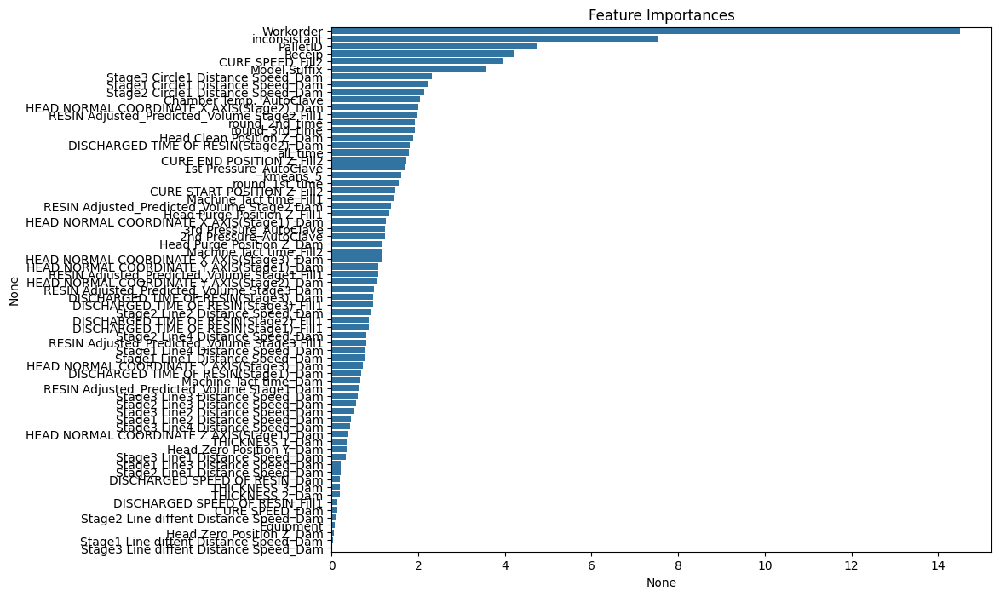

0:	learn: 0.6602763	test: 0.6601290	best: 0.6601290 (0)	total: 152ms	remaining: 2m
100:	learn: 0.2069615	test: 0.1996813	best: 0.1996813 (100)	total: 7.09s	remaining: 49s
200:	learn: 0.2005545	test: 0.1923211	best: 0.1923211 (200)	total: 17.5s	remaining: 52.1s
300:	learn: 0.1975374	test: 0.1908200	best: 0.1907967 (290)	total: 27.1s	remaining: 44.8s
400:	learn: 0.1948447	test: 0.1900659	best: 0.1900628 (397)	total: 36.9s	remaining: 36.7s
500:	learn: 0.1922438	test: 0.1896838	best: 0.1896607 (492)	total: 46.7s	remaining: 27.8s
600:	learn: 0.1902881	test: 0.1896240	best: 0.1895955 (586)	total: 58.1s	remaining: 19.2s
700:	learn: 0.1867060	test: 0.1893920	best: 0.1893749 (694)	total: 1m 11s	remaining: 9.97s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.1893728863
bestIteration = 704

Shrink model to first 705 iterations.


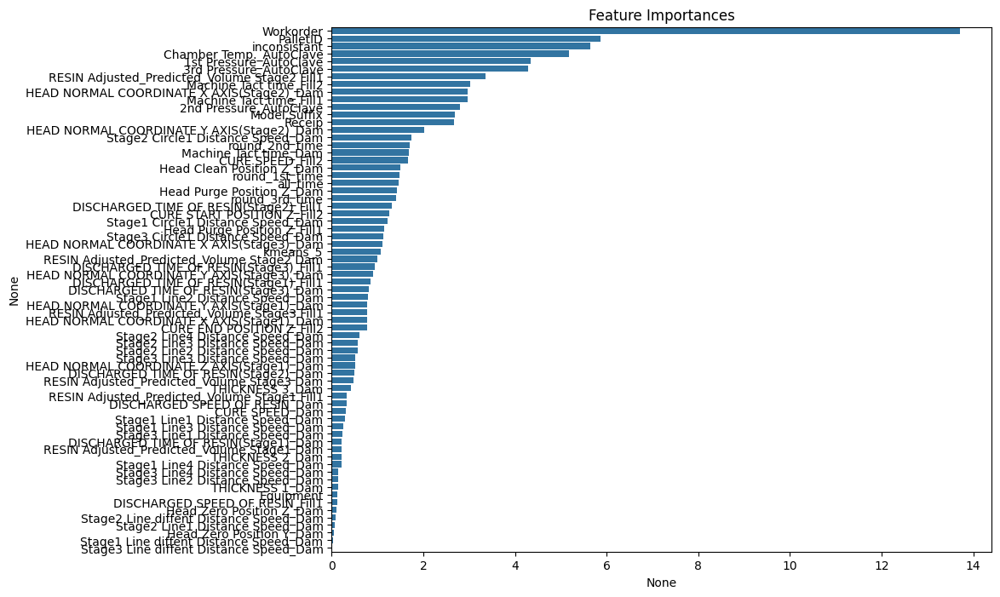

0:	learn: 0.6601889	test: 0.6602410	best: 0.6602410 (0)	total: 134ms	remaining: 1m 46s
100:	learn: 0.2073662	test: 0.2092592	best: 0.2092592 (100)	total: 6.93s	remaining: 47.9s
200:	learn: 0.1987265	test: 0.2058038	best: 0.2058004 (199)	total: 17s	remaining: 50.6s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.2057134859
bestIteration = 240

Shrink model to first 241 iterations.


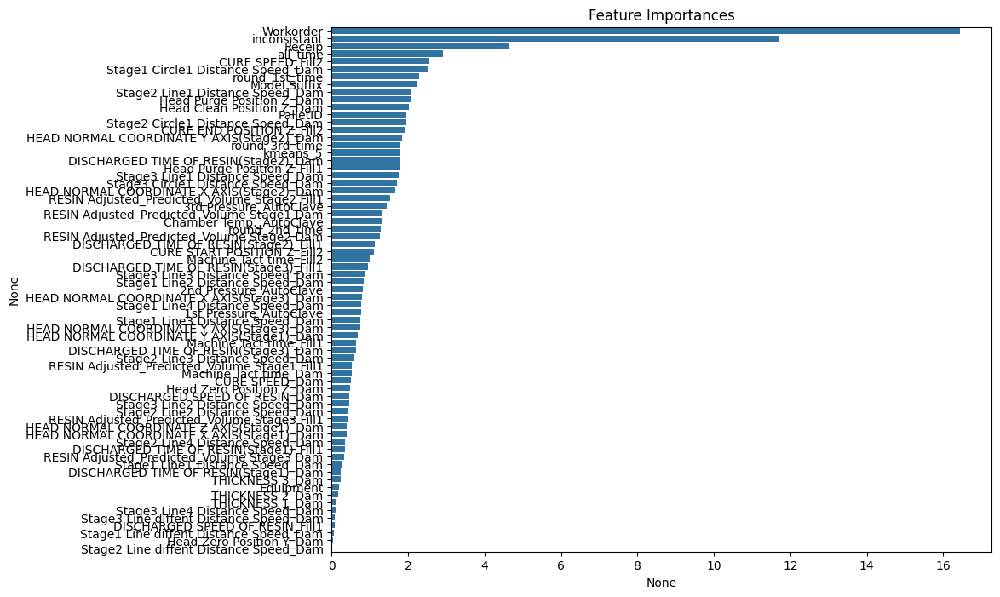

0:	learn: 0.6602218	test: 0.6602407	best: 0.6602407 (0)	total: 152ms	remaining: 2m 1s
100:	learn: 0.2065467	test: 0.2019375	best: 0.2019375 (100)	total: 7.53s	remaining: 52s
200:	learn: 0.1994327	test: 0.1964875	best: 0.1964875 (200)	total: 18.2s	remaining: 54.2s
300:	learn: 0.1964592	test: 0.1957296	best: 0.1957296 (300)	total: 28.4s	remaining: 46.9s
400:	learn: 0.1937129	test: 0.1954811	best: 0.1954811 (400)	total: 38.7s	remaining: 38.4s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.195464301
bestIteration = 434

Shrink model to first 435 iterations.


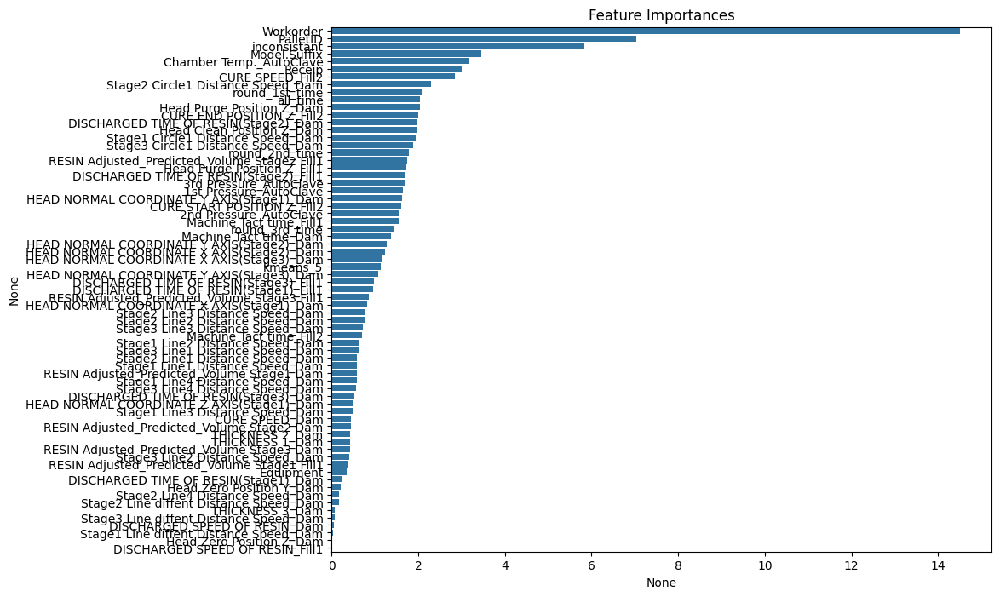

0:	learn: 0.6599465	test: 0.6599974	best: 0.6599974 (0)	total: 142ms	remaining: 1m 53s
100:	learn: 0.2072547	test: 0.2075306	best: 0.2075306 (100)	total: 6.94s	remaining: 47.9s
200:	learn: 0.1990001	test: 0.2020077	best: 0.2020077 (200)	total: 18s	remaining: 53.5s
300:	learn: 0.1960194	test: 0.2009922	best: 0.2009922 (300)	total: 28.3s	remaining: 46.8s
400:	learn: 0.1933617	test: 0.2006422	best: 0.2006422 (400)	total: 38.3s	remaining: 38s
500:	learn: 0.1897322	test: 0.2004004	best: 0.2003982 (496)	total: 49.2s	remaining: 29.3s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.200398199
bestIteration = 496

Shrink model to first 497 iterations.


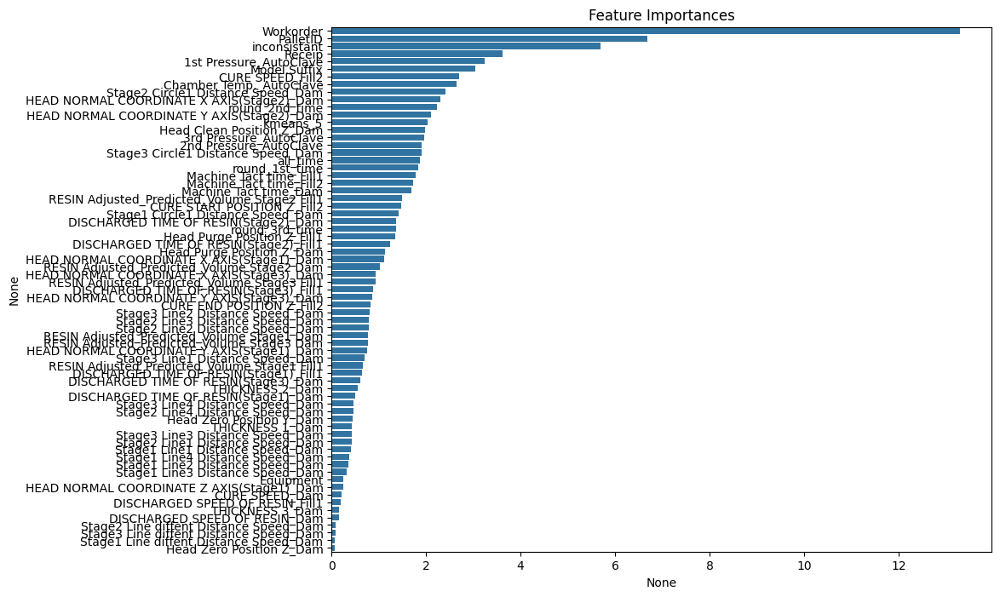

0:	learn: 0.6599060	test: 0.6599754	best: 0.6599754 (0)	total: 127ms	remaining: 1m 41s
100:	learn: 0.2075249	test: 0.2093968	best: 0.2093968 (100)	total: 6.93s	remaining: 47.9s
200:	learn: 0.1991076	test: 0.2033321	best: 0.2033321 (200)	total: 17.8s	remaining: 52.8s
300:	learn: 0.1966486	test: 0.2027238	best: 0.2027206 (291)	total: 27.1s	remaining: 44.8s
400:	learn: 0.1939025	test: 0.2021391	best: 0.2021168 (397)	total: 37.3s	remaining: 37.1s
500:	learn: 0.1912160	test: 0.2019055	best: 0.2018775 (478)	total: 46.6s	remaining: 27.7s
600:	learn: 0.1894140	test: 0.2016691	best: 0.2016665 (595)	total: 58.1s	remaining: 19.1s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.2015526811
bestIteration = 622

Shrink model to first 623 iterations.


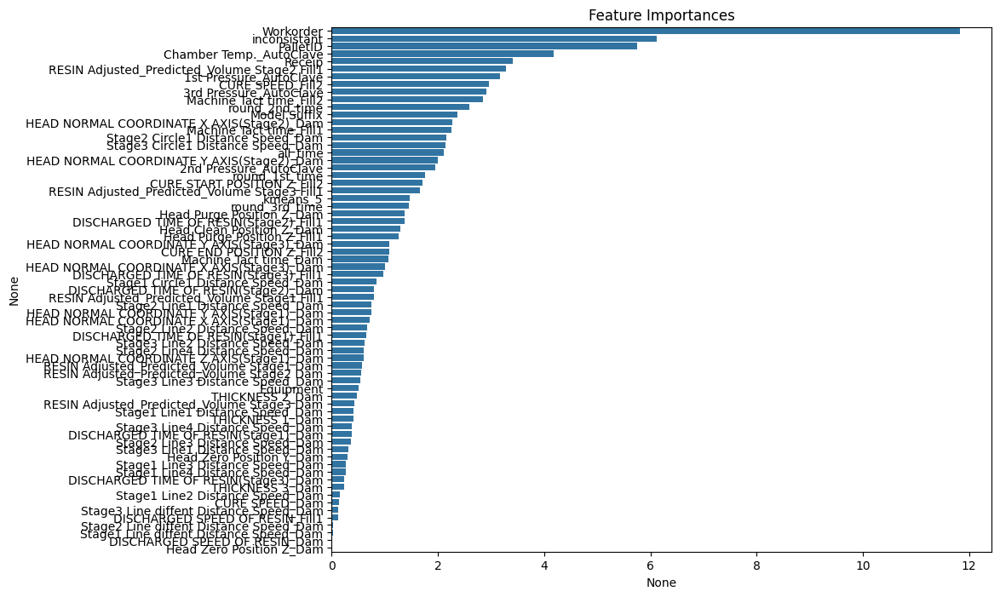

0:	learn: 0.6600193	test: 0.6600081	best: 0.6600081 (0)	total: 137ms	remaining: 1m 49s
100:	learn: 0.2073817	test: 0.2121874	best: 0.2121874 (100)	total: 7.47s	remaining: 51.6s
200:	learn: 0.1993504	test: 0.2049673	best: 0.2049673 (200)	total: 17.5s	remaining: 51.9s
300:	learn: 0.1963271	test: 0.2033340	best: 0.2033309 (299)	total: 27s	remaining: 44.6s
400:	learn: 0.1933287	test: 0.2029465	best: 0.2029465 (400)	total: 36.8s	remaining: 36.5s
500:	learn: 0.1902052	test: 0.2027773	best: 0.2027582 (475)	total: 46.9s	remaining: 27.9s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.2027581937
bestIteration = 475

Shrink model to first 476 iterations.


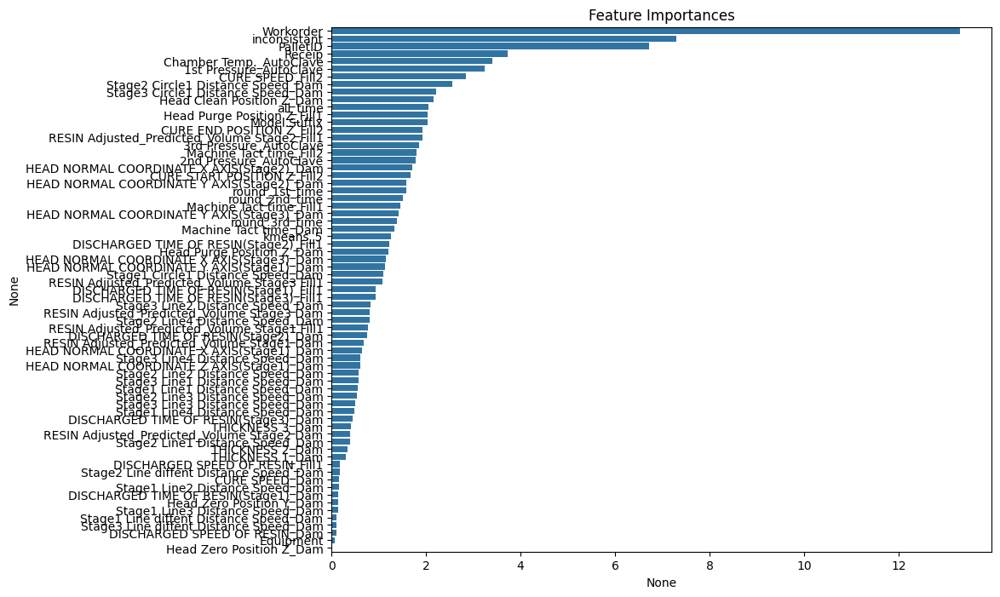

0:	learn: 0.6599627	test: 0.6599829	best: 0.6599829 (0)	total: 124ms	remaining: 1m 38s
100:	learn: 0.2059430	test: 0.2086854	best: 0.2086854 (100)	total: 6.96s	remaining: 48.1s
200:	learn: 0.1989056	test: 0.2048328	best: 0.2048328 (200)	total: 17s	remaining: 50.5s
300:	learn: 0.1953361	test: 0.2040048	best: 0.2040048 (300)	total: 26s	remaining: 43.1s
400:	learn: 0.1926906	test: 0.2035897	best: 0.2035810 (396)	total: 35.9s	remaining: 35.6s
500:	learn: 0.1899441	test: 0.2033816	best: 0.2033087 (480)	total: 45.5s	remaining: 27.1s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.2033087456
bestIteration = 480

Shrink model to first 481 iterations.


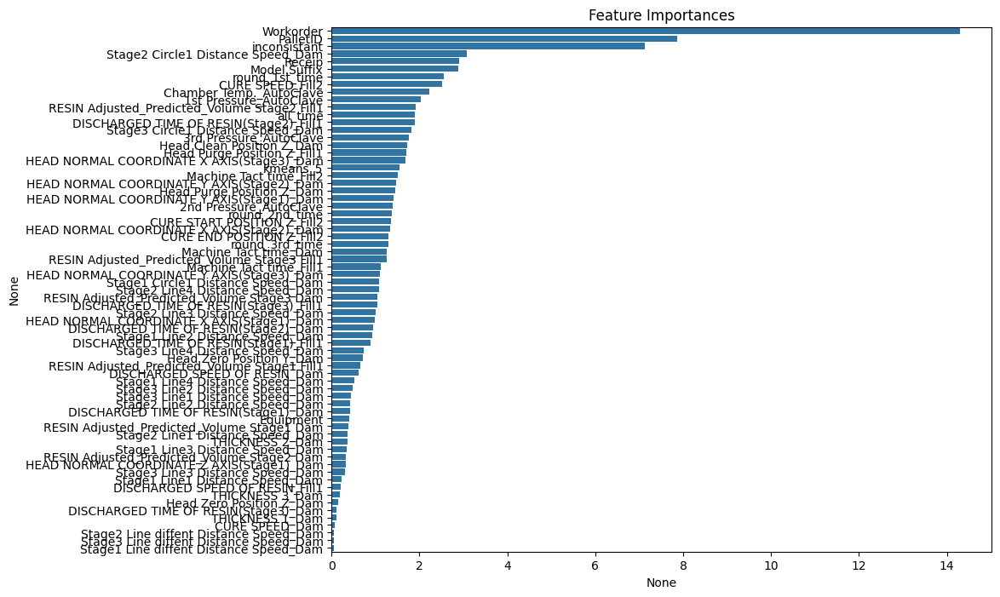

0:	learn: 0.6599902	test: 0.6601301	best: 0.6601301 (0)	total: 129ms	remaining: 1m 43s
100:	learn: 0.2057753	test: 0.2057674	best: 0.2057674 (100)	total: 7.73s	remaining: 53.4s
200:	learn: 0.1988970	test: 0.2014291	best: 0.2014291 (200)	total: 18.1s	remaining: 53.9s
300:	learn: 0.1959863	test: 0.2001870	best: 0.2001807 (298)	total: 28.4s	remaining: 47s
400:	learn: 0.1931817	test: 0.1997186	best: 0.1997181 (397)	total: 37.4s	remaining: 37.1s
500:	learn: 0.1915624	test: 0.1997064	best: 0.1996088 (490)	total: 44.7s	remaining: 26.6s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.1996088463
bestIteration = 490

Shrink model to first 491 iterations.


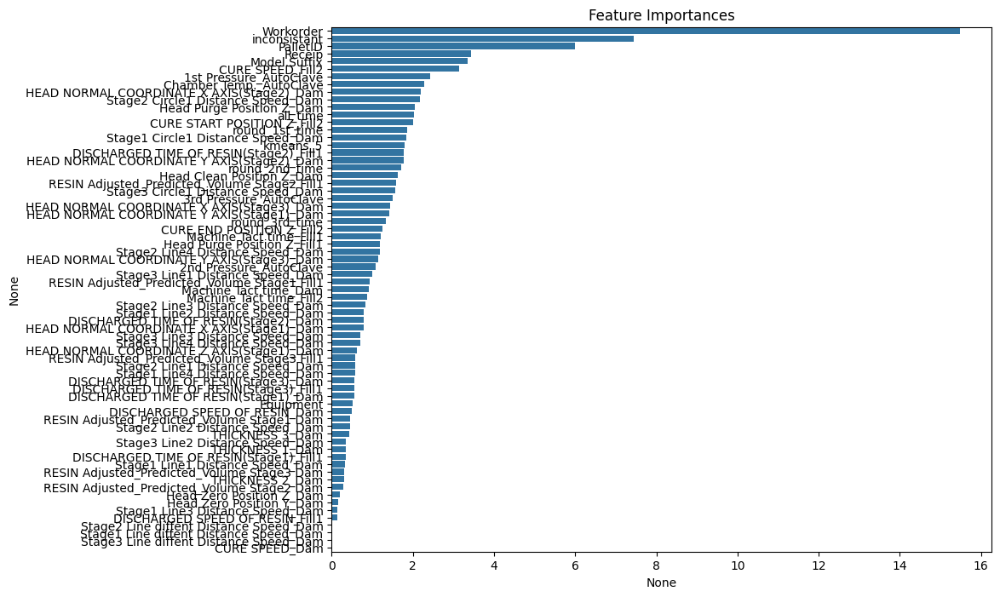

0:	learn: 0.6599729	test: 0.6599955	best: 0.6599955 (0)	total: 126ms	remaining: 1m 40s
100:	learn: 0.2061358	test: 0.2090510	best: 0.2090510 (100)	total: 7.74s	remaining: 53.5s
200:	learn: 0.1982307	test: 0.2049217	best: 0.2049214 (196)	total: 19s	remaining: 56.6s
300:	learn: 0.1945755	test: 0.2041720	best: 0.2041619 (298)	total: 29.2s	remaining: 48.4s
400:	learn: 0.1912055	test: 0.2037917	best: 0.2037412 (379)	total: 40.5s	remaining: 40.2s
500:	learn: 0.1894173	test: 0.2036844	best: 0.2036512 (497)	total: 49.8s	remaining: 29.6s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.2035973307
bestIteration = 513

Shrink model to first 514 iterations.


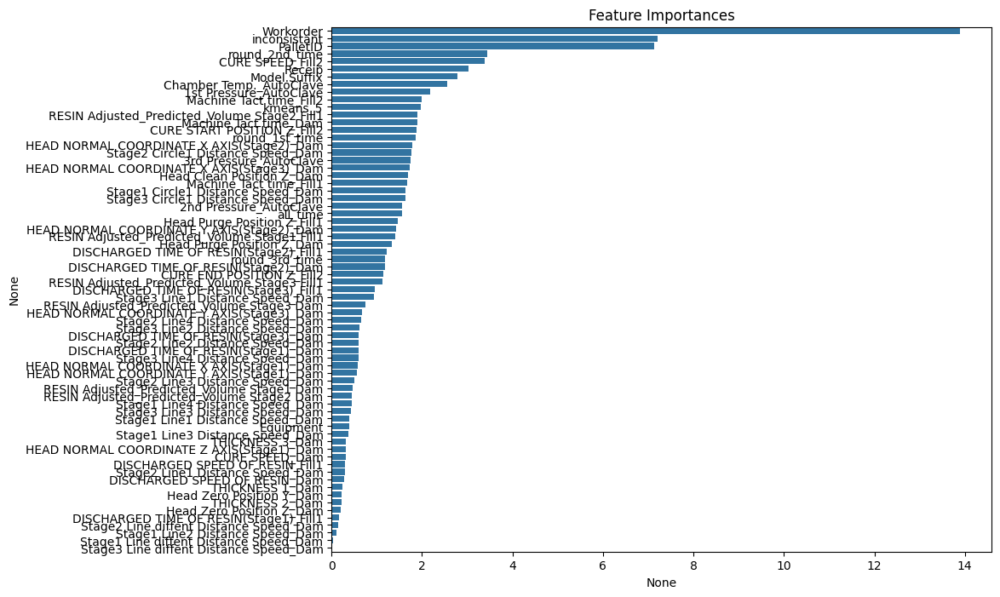

In [86]:
# Stratified cv fitting models

# 해당 모델 저장 리스트
models_cat_train = []

# split마다 모델 적합하기
for train_idx, valid_idx in tscv.split(X_train_cat_last, y_train_cat_last):
    
    print("="*50)
    cat_best_params["random_seed"] = 42
    cat_best_model = CatBoostClassifier(**cat_best_params)
    
    
    # fit the model
    cat_best_model.fit(
        X_train_cat_last.iloc[train_idx], y_train_cat_last[train_idx],
        eval_set = [(X_train_cat_last.iloc[valid_idx], y_train_cat_last[valid_idx])],
        early_stopping_rounds = 50,
        verbose = 100, cat_features=cat_features_indices
    )

    # 모델 결과 저장하기
    models_cat_train.append(cat_best_model)
    
    # 위 feature importance를 시각화해봅니다.
    importances = pd.Series(cat_best_model.feature_importances_, index=list(X_train_cat_last.columns))
    importances = importances.sort_values(ascending=False)

    plt.figure(figsize=(10,8))
    plt.title("Feature Importances")
    sns.barplot(x=importances, y=importances.index)
    plt.show()

In [87]:
# predict
pred_list = []

# 각 모델별 예측값 가져오기
for i, model in enumerate(models_cat_train):
    pred_list.append(model.predict_proba(X_valid_cat_last)[:, 1])
    
# 확률값 평균내기
cat_proba = np.mean(pred_list, axis = 0)

In [88]:
# thresholds
precision, recall, thresholds = precision_recall_curve(y_valid_cat_last, cat_proba)
f1_scores = 2*recall*precision / (recall + precision)
cat_best_threshold = thresholds[np.argmax(f1_scores)]
y_pred_custom_threshold_cat = (cat_proba >= cat_best_threshold).astype(int)

In [89]:
get_clf_eval(y_valid_cat_last, y_pred_custom_threshold_cat)

오차행렬:
 [[ 122  348]
 [ 635 6997]]

정확도: 0.8787
정밀도: 0.1612
재현율: 0.2596
F1: 0.1989


#### Lightgbm

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[933]	valid_0's binary_logloss: 0.20591


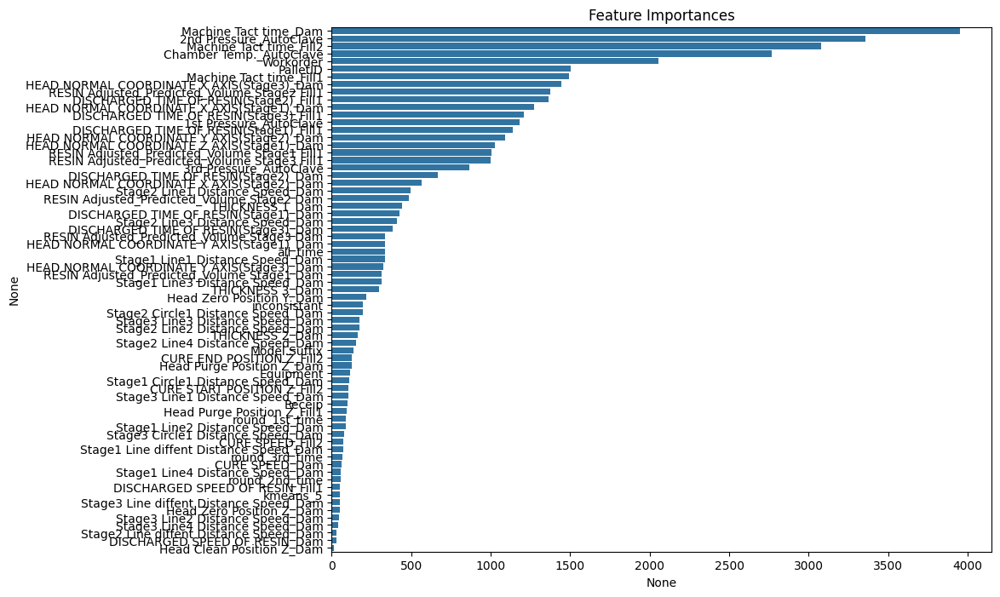

Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1200]	valid_0's binary_logloss: 0.19323


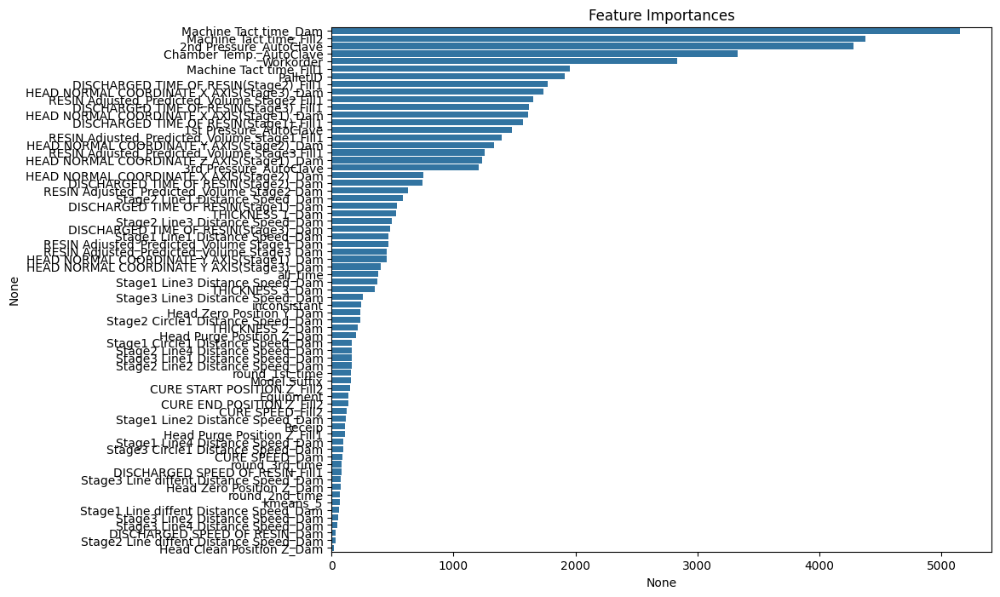

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[978]	valid_0's binary_logloss: 0.207707


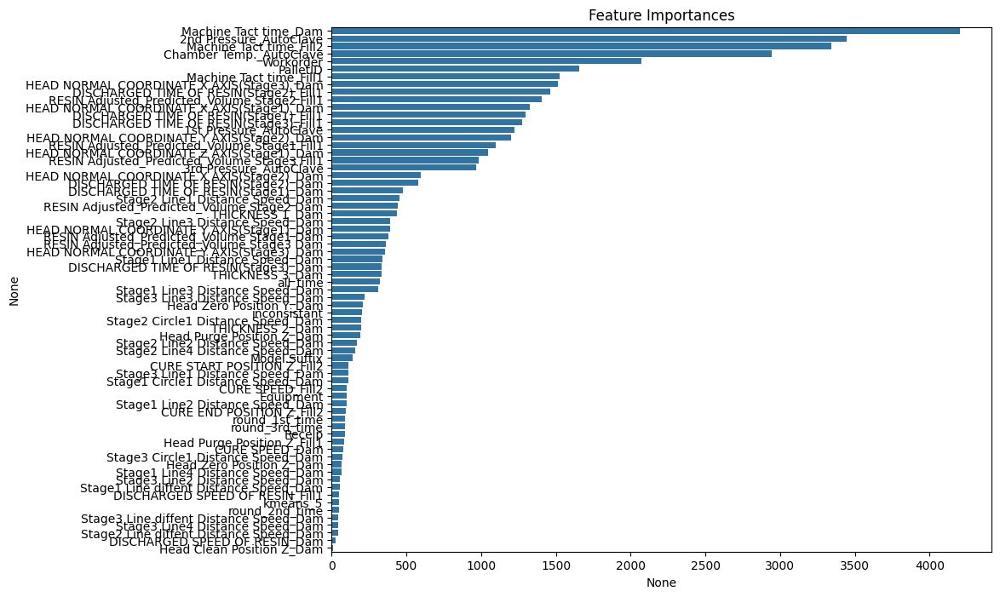

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[1146]	valid_0's binary_logloss: 0.198578


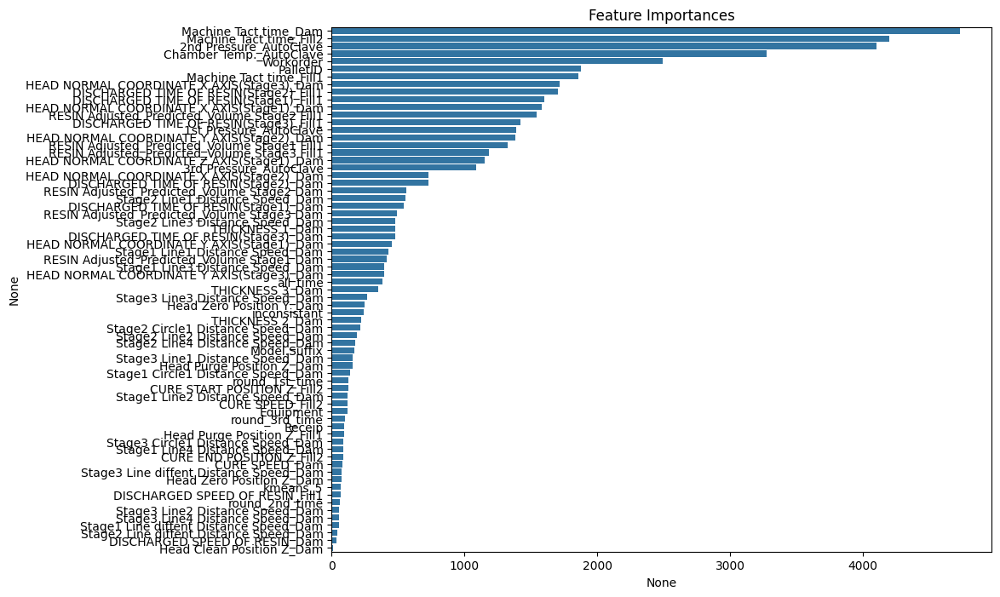

Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1200]	valid_0's binary_logloss: 0.201649


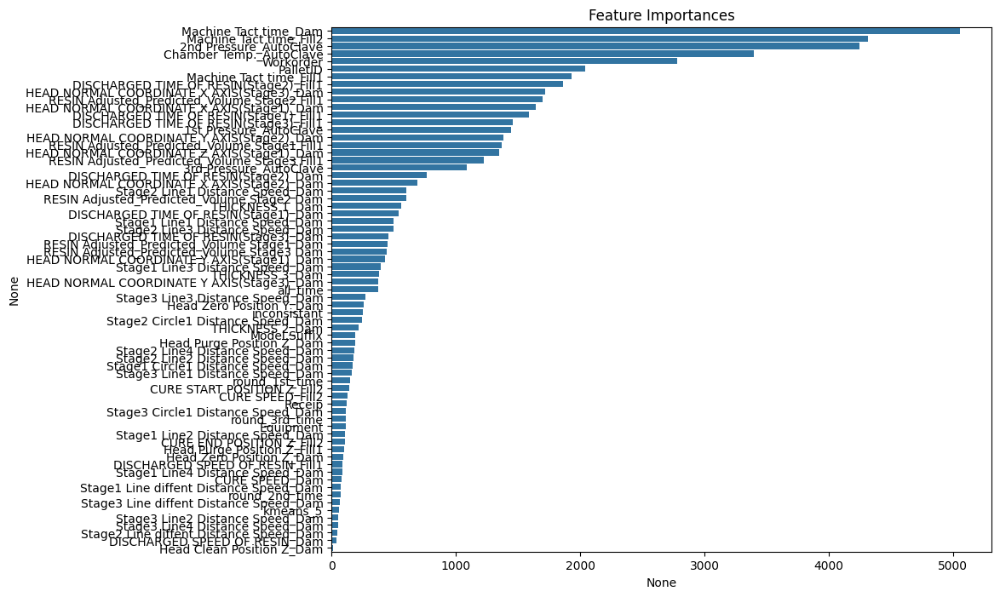

Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1189]	valid_0's binary_logloss: 0.205326


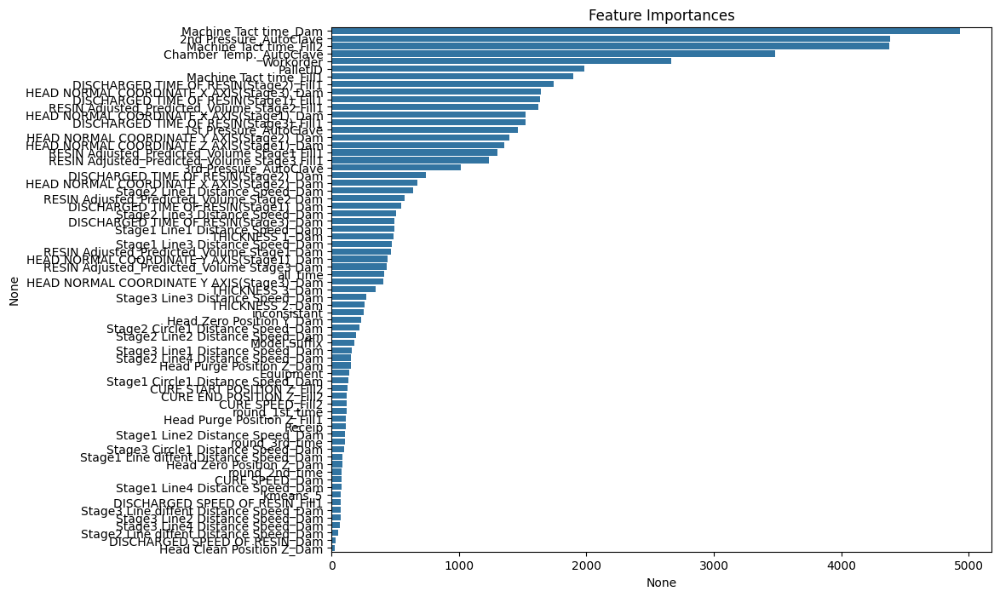

Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1199]	valid_0's binary_logloss: 0.202854


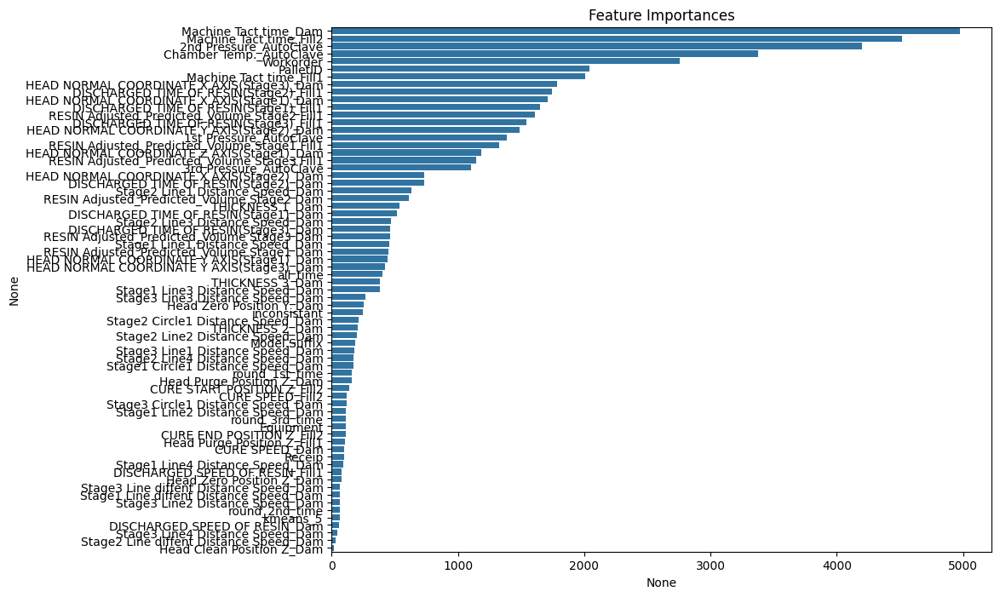

Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1185]	valid_0's binary_logloss: 0.204067


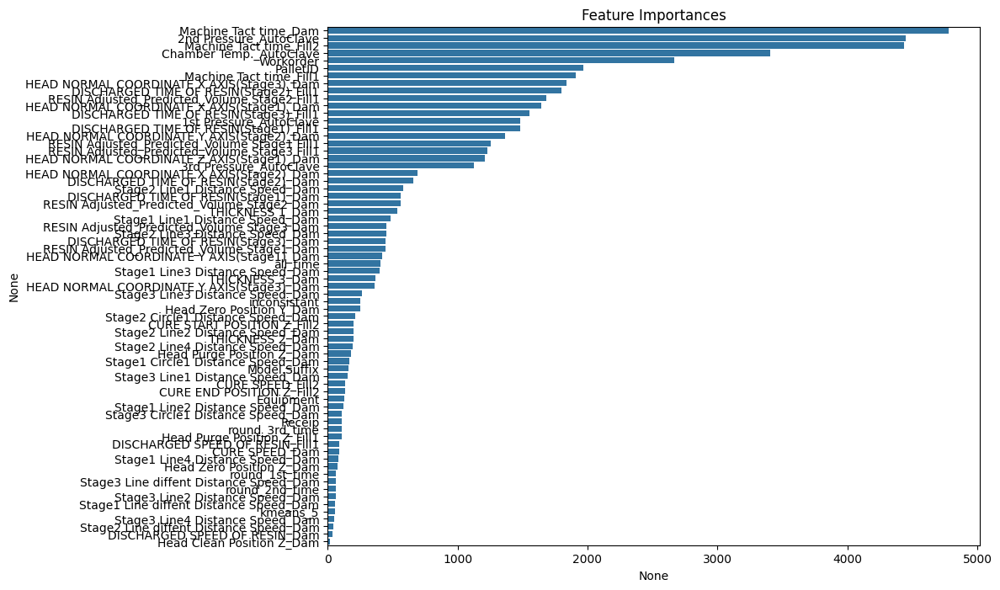

Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1199]	valid_0's binary_logloss: 0.201957


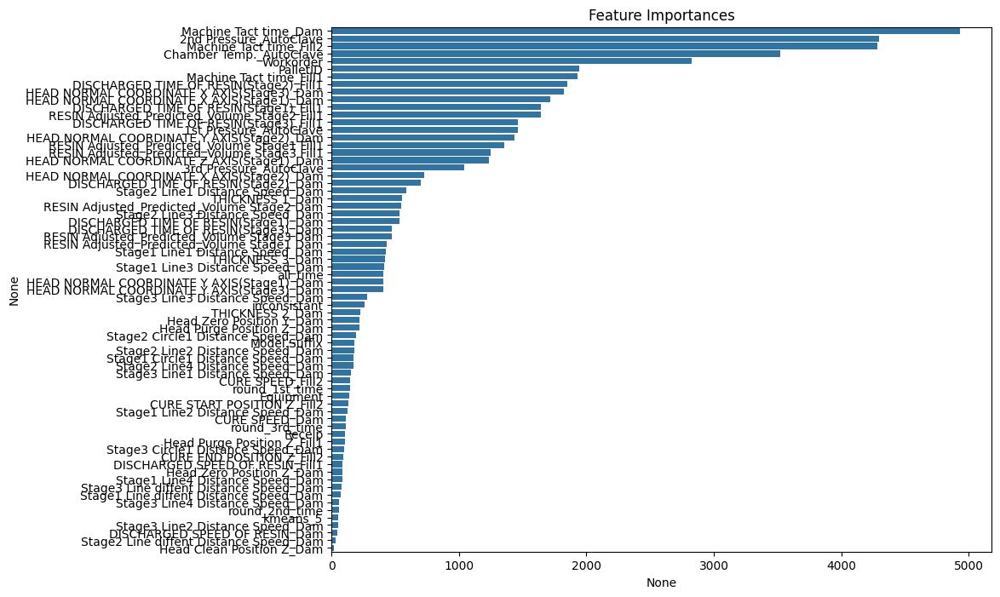

Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1200]	valid_0's binary_logloss: 0.204503


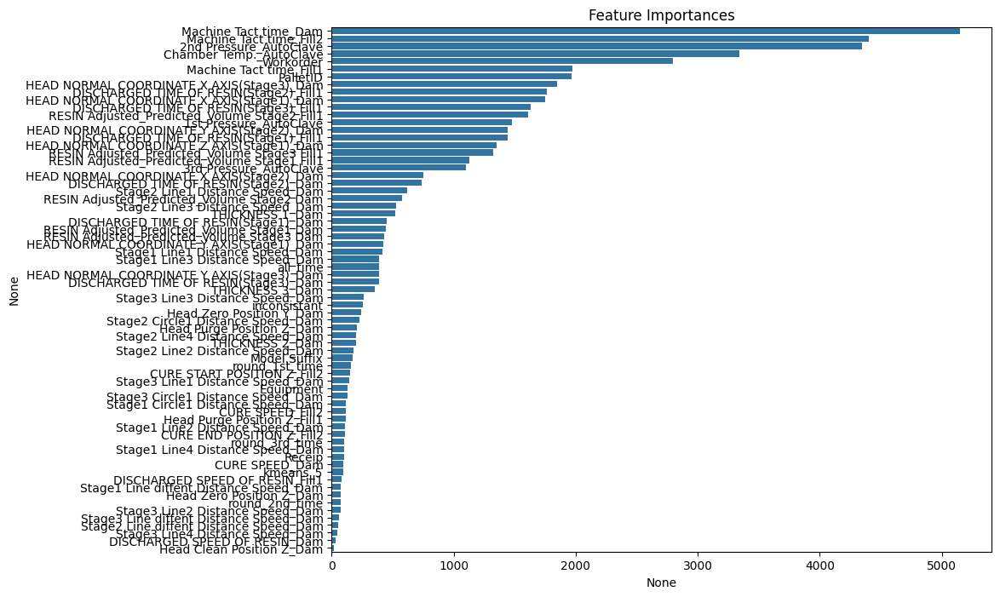

In [90]:
# Stratified cv fitting models

# 해당 모델 저장 리스트
models_lgbm_train = []

# split마다 모델 적합하기
for train_idx, valid_idx in tscv.split(X_train_lgbm_last, y_train_lgbm_last):
    
    print("="*50)
    lgbm_best_params["random_seed"] = 42
    lgbm_best_model = LGBMClassifier(**lgbm_best_params)

    # fit the model
    lgbm_best_model.fit(
        X_train_lgbm_last.iloc[train_idx], y_train_lgbm_last[train_idx],
        eval_set = [(X_train_lgbm_last.iloc[valid_idx], y_train_lgbm_last[valid_idx])],
        categorical_feature=cat_features_indices,
        callbacks=[
            lgb.early_stopping(stopping_rounds=50),
        ]
    )

    # 모델 결과 저장하기
    models_lgbm_train.append(lgbm_best_model)
    
    # 위 feature importance를 시각화해봅니다.
    importances = pd.Series(lgbm_best_model.feature_importances_, index=list(X_train_lgbm_last.columns))
    importances = importances.sort_values(ascending=False)

    plt.figure(figsize=(10,8))
    plt.title("Feature Importances")
    sns.barplot(x=importances, y=importances.index)
    plt.show()

In [91]:
# predict
pred_list = []

# 각 모델별 예측값 가져오기
for i, model in enumerate(models_lgbm_train):
    pred_list.append(model.predict_proba(X_valid_lgbm_last)[:, 1])
    
# 확률값 평균내기
lgbm_proba = np.mean(pred_list, axis = 0)

In [92]:
# thresholds
precision, recall, thresholds = precision_recall_curve(y_valid_lgbm_last, lgbm_proba)
f1_scores = 2*recall*precision / (recall + precision)
lgbm_best_threshold = thresholds[np.argmax(f1_scores)]
y_pred_custom_threshold_lgbm = (lgbm_proba >= lgbm_best_threshold).astype(int)

In [93]:
get_clf_eval(y_valid_lgbm_last, y_pred_custom_threshold_lgbm)

오차행렬:
 [[ 104  366]
 [ 336 7296]]

정확도: 0.9134
정밀도: 0.2364
재현율: 0.2213
F1: 0.2286


#### XGBoost

[0]	validation_0-logloss:0.25866


/home/elicer/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [10:33:21] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "random_seed" } are not used.

  warnings.warn(smsg, UserWarning)


[100]	validation_0-logloss:0.20587
[200]	validation_0-logloss:0.20400
[219]	validation_0-logloss:0.20394


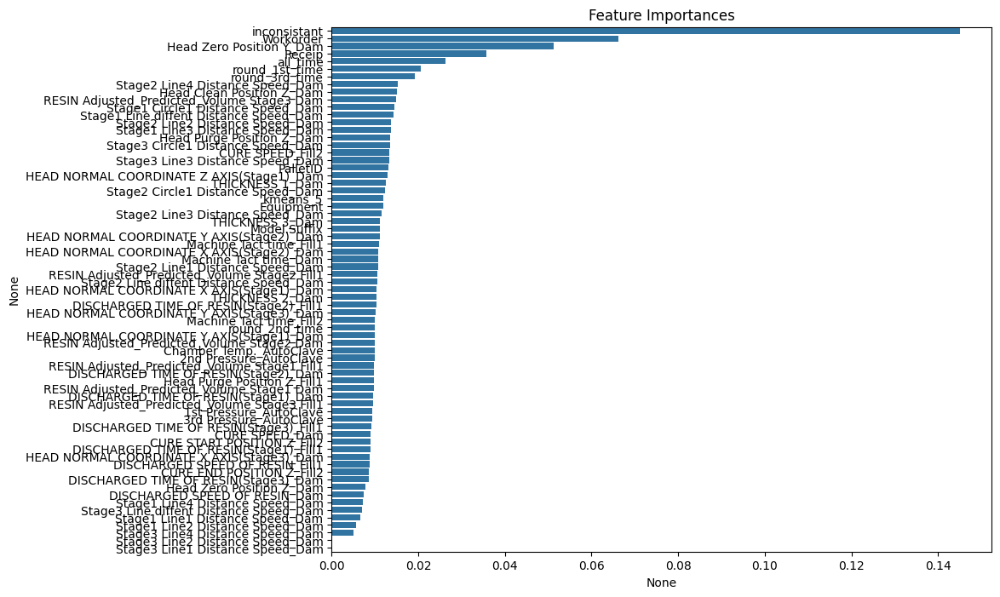

[0]	validation_0-logloss:0.25848


/home/elicer/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [10:33:24] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "random_seed" } are not used.

  warnings.warn(smsg, UserWarning)


[100]	validation_0-logloss:0.19584
[200]	validation_0-logloss:0.18934
[245]	validation_0-logloss:0.18843


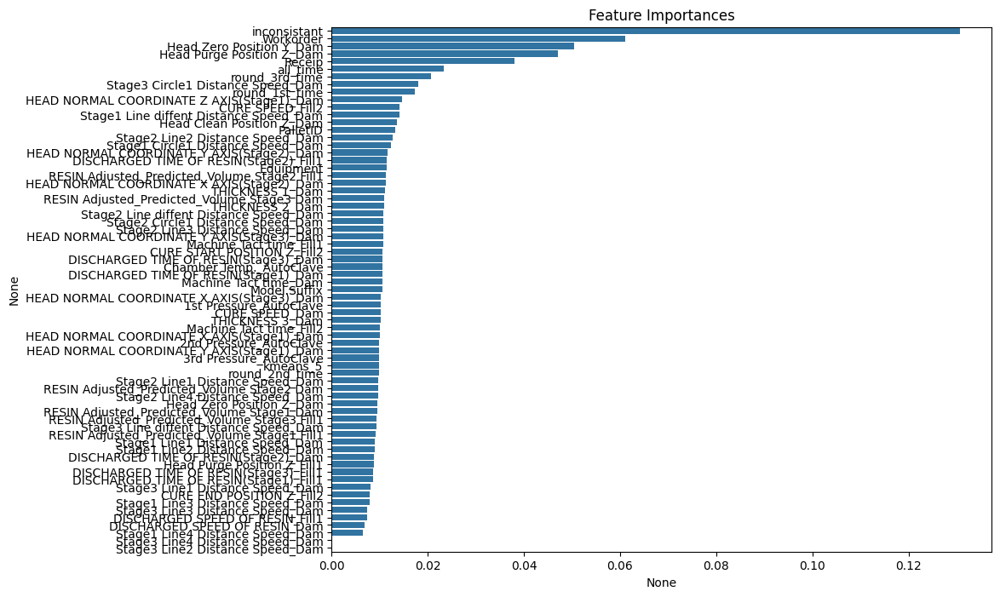

[0]	validation_0-logloss:0.25870


/home/elicer/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [10:33:26] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "random_seed" } are not used.

  warnings.warn(smsg, UserWarning)


[100]	validation_0-logloss:0.20802
[192]	validation_0-logloss:0.20702


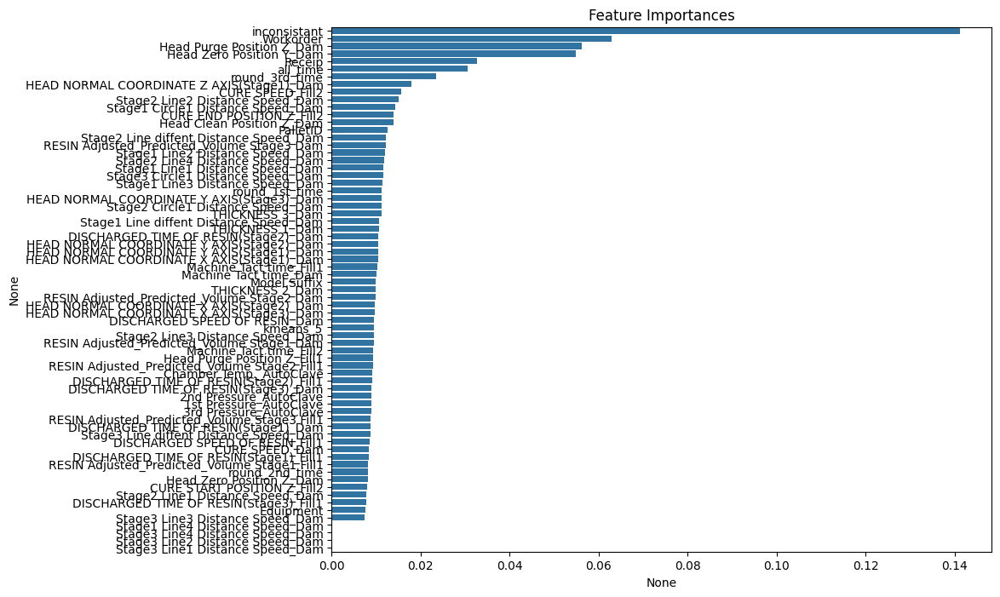

[0]	validation_0-logloss:0.25855


/home/elicer/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [10:33:28] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "random_seed" } are not used.

  warnings.warn(smsg, UserWarning)


[100]	validation_0-logloss:0.20074
[200]	validation_0-logloss:0.19835
[245]	validation_0-logloss:0.19849


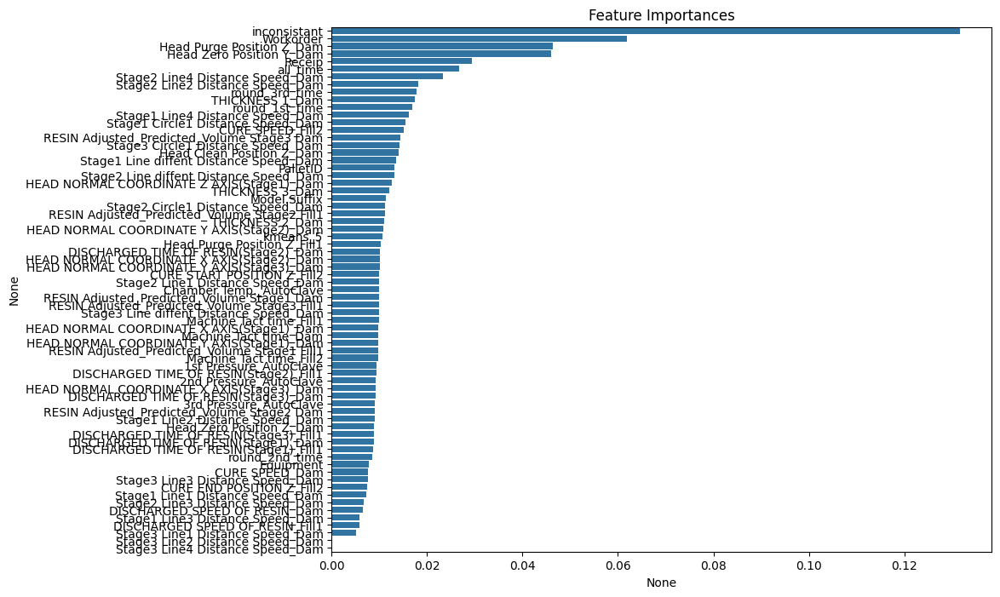

[0]	validation_0-logloss:0.25860


/home/elicer/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [10:33:30] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "random_seed" } are not used.

  warnings.warn(smsg, UserWarning)


[100]	validation_0-logloss:0.20323
[200]	validation_0-logloss:0.19957
[244]	validation_0-logloss:0.19964


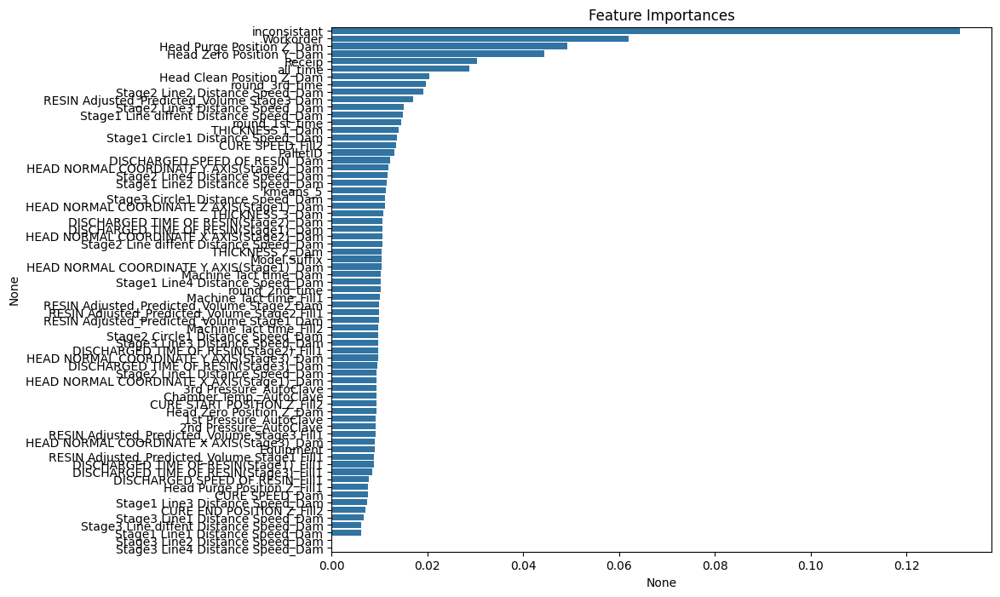

[0]	validation_0-logloss:0.25867


/home/elicer/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [10:33:33] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "random_seed" } are not used.

  warnings.warn(smsg, UserWarning)


[100]	validation_0-logloss:0.20591
[200]	validation_0-logloss:0.20367
[229]	validation_0-logloss:0.20378


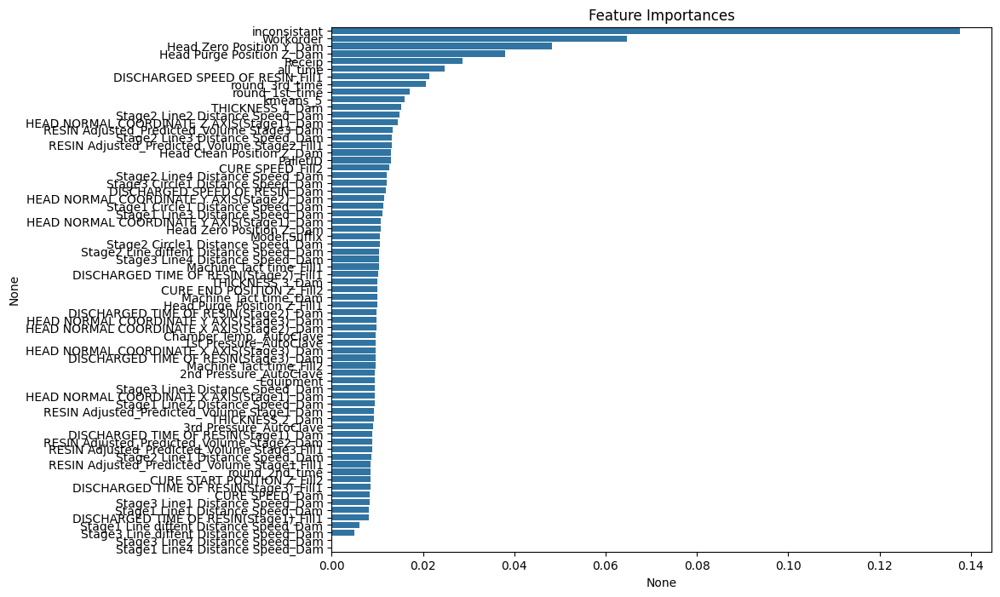

[0]	validation_0-logloss:0.25865


/home/elicer/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [10:33:35] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "random_seed" } are not used.

  warnings.warn(smsg, UserWarning)


[100]	validation_0-logloss:0.20682
[200]	validation_0-logloss:0.20326
[245]	validation_0-logloss:0.20302


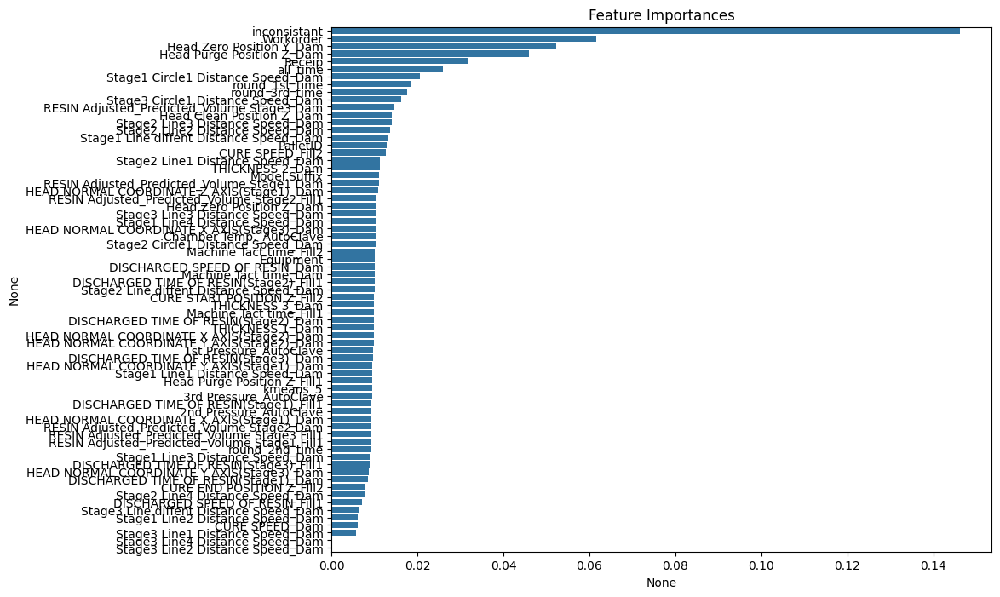

[0]	validation_0-logloss:0.25863


/home/elicer/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [10:33:37] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "random_seed" } are not used.

  warnings.warn(smsg, UserWarning)


[100]	validation_0-logloss:0.20720
[200]	validation_0-logloss:0.20443
[245]	validation_0-logloss:0.20497


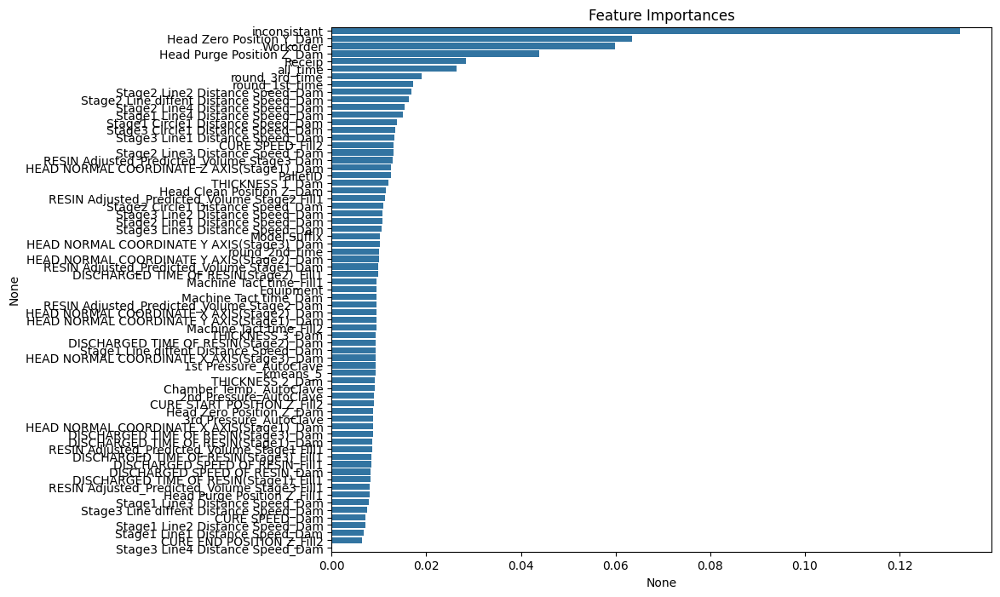

[0]	validation_0-logloss:0.25855


/home/elicer/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [10:33:40] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "random_seed" } are not used.

  warnings.warn(smsg, UserWarning)


[100]	validation_0-logloss:0.20360
[200]	validation_0-logloss:0.20133
[229]	validation_0-logloss:0.20168


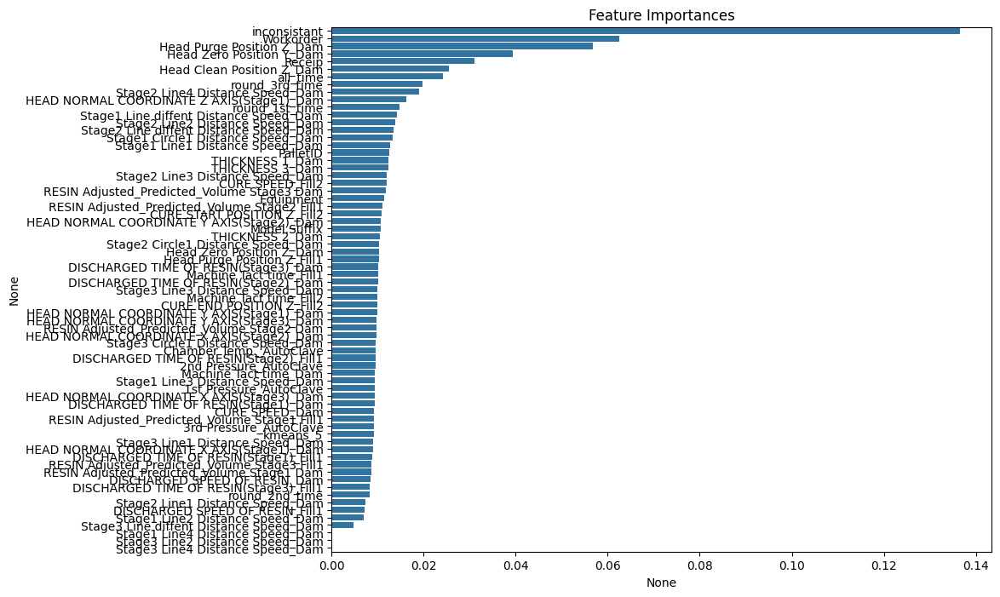

[0]	validation_0-logloss:0.25856


/home/elicer/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [10:33:42] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "random_seed" } are not used.

  warnings.warn(smsg, UserWarning)


[100]	validation_0-logloss:0.20667
[200]	validation_0-logloss:0.20390
[245]	validation_0-logloss:0.20380


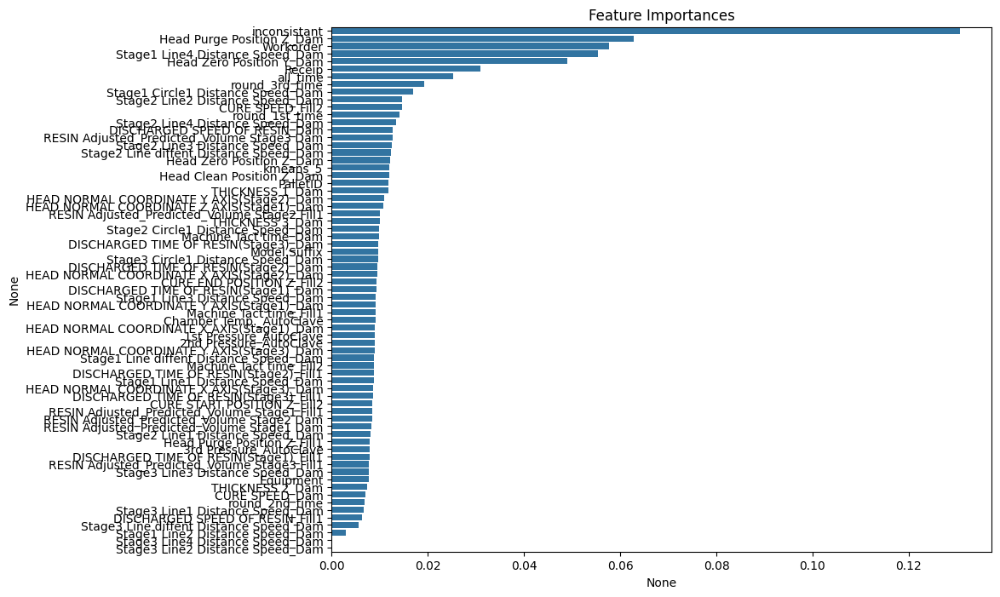

In [94]:
# Stratified cv fitting models_xgb_train

# 해당 모델 저장 리스트
models_xgb_train = []

# split마다 모델 적합하기
for train_idx, valid_idx in tscv.split(X_train_xgb_last, y_train_xgb_last):
    
    print("="*50)
    xgb_best_params["seed"] = 42
    xgb_best_model = XGBClassifier(**xgb_best_params, early_stopping_rounds = 50, enable_categorical=True,)

    # fit the model
    xgb_best_model.fit(
        X_train_xgb_last.iloc[train_idx], y_train_xgb_last[train_idx],
        eval_set = [(X_train_xgb_last.iloc[valid_idx], y_train_xgb_last[valid_idx])],
        verbose = 100
    )

    # 모델 결과 저장하기
    models_xgb_train.append(xgb_best_model)
    
    # 위 feature importance를 시각화해봅니다.
    importances = pd.Series(xgb_best_model.feature_importances_, index=list(X_train_xgb_last.columns))
    importances = importances.sort_values(ascending=False)

    plt.figure(figsize=(10,8))
    plt.title("Feature Importances")
    sns.barplot(x=importances, y=importances.index)
    plt.show()

In [95]:
# predict
pred_list = []

# 각 모델별 예측값 가져오기
for i, model in enumerate(models_xgb_train):
    pred_list.append(model.predict_proba(X_valid_xgb_last)[:, 1])
    
# 확률값 평균내기
xgb_proba = np.mean(pred_list, axis = 0)

In [96]:
# thresholds
precision, recall, thresholds = precision_recall_curve(y_valid_xgb_last, xgb_proba)
f1_scores = 2*recall*precision / (recall + precision)
xgb_best_threshold = thresholds[np.argmax(f1_scores)]
y_pred_custom_threshold_xgb = (xgb_proba >= xgb_best_threshold).astype(int)

In [97]:
get_clf_eval(y_valid_xgb_last, y_pred_custom_threshold_xgb)

오차행렬:
 [[ 115  355]
 [ 404 7228]]

정확도: 0.9063
정밀도: 0.2216
재현율: 0.2447
F1: 0.2326


#### Ensemble tuning

In [98]:
def weight_test(last_num, test_set, prob):

    from itertools import product
    col_n = len(prob.columns)
    row_n = len(prob)
    
    
    # best ensemble
    best_f1 = 0
    best_f1_t = 0
    best_weights = None
    best_weights_t = None
    A = [i for i in range(last_num + 1)]
    
    for w in tqdm(product(A, repeat = col_n)):
        
        # 가중치 열 만들기
        weight_frame = pd.DataFrame([w]*row_n, columns = prob.columns)
        
        # 가중치 곱해주기
        prob_weight = prob * weight_frame
        
        # 가중치의 합
        w_sum = sum(w)
        
        # 평균 계산해주기
        final_proba = np.sum(prob_weight/w_sum, axis = 1)
        
        # 가중 평균 계산
        y_pred = (final_proba > 0.5).astype(int)

        # F1 스코어 계산
        f1 = f1_score(test_set, y_pred)

        # Threshold 스코어 계산
        precision, recall, thresholds = precision_recall_curve(test_set, final_proba)
        f1_scores = 2*recall*precision / (recall + precision)
        best_threshold = thresholds[np.argmax(f1_scores)]
        y_pred_custom_threshold = (final_proba >= best_threshold).astype(int)
        f1_t = f1_score(test_set, y_pred_custom_threshold)

        # 최고 성능 저장
        if f1 > best_f1:
            best_f1 = f1
            best_weights = w

        if f1_t > best_f1_t:
            best_f1_t = f1_t
            best_weights_t = w
            
#         print(f'weight: {w}, best_f1: {best_f1}, best_f1_t: {best_f1_t}, best_weights: {best_weights}, best_weights_t: {best_weights_t}')

    print('종료되었습니다.')
    return best_f1, best_f1_t, best_weights, best_weights_t

In [99]:
# 함수 적용
best_f1, best_f1_t, best_weights, best_weights_t = weight_test(last_num = 20, test_set = y_valid_xgb_last, prob = pd.DataFrame({'cat_proba': cat_proba, 'lgbm_proba': lgbm_proba, 'xgb_proba': xgb_proba}))
print(f'best_f1: {best_f1}, best_f1_t: {best_f1_t}, best_weights: {best_weights}, best_weights_t: {best_weights_t}')

9261it [01:43, 89.10it/s]

종료되었습니다.
best_f1: 0.11623246492985972, best_f1_t: 0.23595505617977527, best_weights: (1, 0, 0), best_weights_t: (4, 12, 1)


In [100]:
# best ensemble 적용
cat = cat_proba * best_weights_t[0]
lgbm = lgbm_proba * best_weights_t[1]
xgb = xgb_proba * best_weights_t[2]
y_best = (cat + lgbm + xgb)/(sum(best_weights_t))

In [101]:
precision, recall, thresholds = precision_recall_curve(y_valid_xgb_last, y_best)
f1_scores = 2*recall*precision / (recall + precision)
weights_best_threshold = thresholds[np.argmax(f1_scores)]
y_pred_custom_threshold = (y_best >= weights_best_threshold).astype(int)
get_clf_eval(y_valid_xgb_last, y_pred_custom_threshold)

오차행렬:
 [[ 105  365]
 [ 315 7317]]

정확도: 0.9161
정밀도: 0.2500
재현율: 0.2234
F1: 0.2360


## 6. Inference

### Catboost

In [102]:
# 해당 모델 저장 리스트
models_cat = []

# split마다 모델 적합하기
for train_idx, valid_idx in tscv.split(X_cat, y_cat):
    
    print("="*50)
    cat_best_params["random_seed"] = 42
    cat_best_model = CatBoostClassifier(**cat_best_params)

    # fit the model
    cat_best_model.fit(
        X_cat.iloc[train_idx], y_cat[train_idx],
        eval_set = [(X_cat.iloc[valid_idx], y_cat[valid_idx])],
        early_stopping_rounds = 50,
        verbose = 100, cat_features=cat_features_indices
    )

    # 모델 결과 저장하기
    models_cat.append(cat_best_model)

0:	learn: 0.6596071	test: 0.6597517	best: 0.6597517 (0)	total: 206ms	remaining: 2m 44s
100:	learn: 0.2079783	test: 0.2117007	best: 0.2117007 (100)	total: 8.75s	remaining: 1m
200:	learn: 0.1990234	test: 0.2044760	best: 0.2044760 (200)	total: 21.3s	remaining: 1m 3s
300:	learn: 0.1958483	test: 0.2037465	best: 0.2037465 (300)	total: 33.5s	remaining: 55.4s
400:	learn: 0.1931895	test: 0.2033455	best: 0.2033455 (400)	total: 46.2s	remaining: 45.9s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.2032600268
bestIteration = 441

Shrink model to first 442 iterations.
0:	learn: 0.6607262	test: 0.6606053	best: 0.6606053 (0)	total: 23.9ms	remaining: 19.1s
100:	learn: 0.2065621	test: 0.2050504	best: 0.2050504 (100)	total: 8.85s	remaining: 1m 1s
200:	learn: 0.2002300	test: 0.1999855	best: 0.1999855 (200)	total: 20.9s	remaining: 1m 2s
300:	learn: 0.1974234	test: 0.1990171	best: 0.1990113 (299)	total: 31.6s	remaining: 52.3s
400:	learn: 0.1953395	test: 0.1985182	best: 0.1985182 (400)	t

In [103]:
# predict
pred_list = []

# 각 모델별 예측값 가져오기
for i, model in enumerate(models_cat):
    pred_list.append(model.predict_proba(X_test_cat)[:, 1])

# 확률값 평균내기
cat_proba = np.mean(pred_list, axis = 0)

In [104]:
np.unique(np.where(cat_proba >= 0.5, 1, 0), return_counts = True)

(array([0, 1]), array([17287,    74]))

### LGBM

In [105]:
# 해당 모델 저장 리스트
models_lgbm = []

# split마다 모델 적합하기
for train_idx, valid_idx in tscv.split(X_lgbm, y_lgbm):
    
    print("="*50)
    lgbm_best_params["random_seed"] = 42
    lgbm_best_model = LGBMClassifier(**lgbm_best_params)

    # fit the model
    lgbm_best_model.fit(
        X_lgbm.iloc[train_idx], y_lgbm[train_idx],
        eval_set = [(X_lgbm.iloc[valid_idx], y_lgbm[valid_idx])],
        categorical_feature=cat_features_indices,
        callbacks=[
            lgb.early_stopping(stopping_rounds=50),
        ]
    )

    # 모델 결과 저장하기
    models_lgbm.append(lgbm_best_model)

Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1199]	valid_0's binary_logloss: 0.204785
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1199]	valid_0's binary_logloss: 0.199834
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1199]	valid_0's binary_logloss: 0.201851
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1200]	valid_0's binary_logloss: 0.203186
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1200]	valid_0's binary_logloss: 0.199767
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[1199]	valid_0's binary_logloss: 0.19627
Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best 

In [106]:
# predict
pred_list = []

# 각 모델별 예측값 가져오기
for i, model in enumerate(models_lgbm):
    pred_list.append(model.predict_proba(X_test_lgbm)[:, 1])
    
# 확률값 평균내기
lgbm_proba = np.mean(pred_list, axis = 0)

In [107]:
np.unique(np.where(lgbm_proba >= 0.5, 1, 0), return_counts = True)

(array([0, 1]), array([17307,    54]))

### XGB

In [108]:
# 해당 모델 저장 리스트
models_xgb = []

# split마다 모델 적합하기
for train_idx, valid_idx in tscv.split(X_xgb, y_xgb):
    
    print("="*50)
    xgb_best_params["seed"] = 42
    xgb_best_model = XGBClassifier(**xgb_best_params, early_stopping_rounds = 50, enable_categorical=True)

    # fit the model
    xgb_best_model.fit(
        X_xgb.iloc[train_idx], y_xgb[train_idx],
        eval_set = [(X_xgb.iloc[valid_idx], y_xgb[valid_idx])],
        verbose = 100
    )

    # 모델 결과 저장하기
    models_xgb.append(xgb_best_model)

[0]	validation_0-logloss:0.25867


/home/elicer/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [10:48:14] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "random_seed" } are not used.

  warnings.warn(smsg, UserWarning)


[100]	validation_0-logloss:0.20621
[200]	validation_0-logloss:0.20430
[224]	validation_0-logloss:0.20445
[0]	validation_0-logloss:0.25854


/home/elicer/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [10:48:16] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "random_seed" } are not used.

  warnings.warn(smsg, UserWarning)


[100]	validation_0-logloss:0.20219
[200]	validation_0-logloss:0.19822
[245]	validation_0-logloss:0.19825
[0]	validation_0-logloss:0.25858


/home/elicer/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [10:48:18] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "random_seed" } are not used.

  warnings.warn(smsg, UserWarning)


[100]	validation_0-logloss:0.20477
[200]	validation_0-logloss:0.20163
[239]	validation_0-logloss:0.20180
[0]	validation_0-logloss:0.25860


/home/elicer/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [10:48:20] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "random_seed" } are not used.

  warnings.warn(smsg, UserWarning)


[100]	validation_0-logloss:0.20577
[200]	validation_0-logloss:0.20288
[215]	validation_0-logloss:0.20298
[0]	validation_0-logloss:0.25859


/home/elicer/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [10:48:21] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "random_seed" } are not used.

  warnings.warn(smsg, UserWarning)


[100]	validation_0-logloss:0.20199
[200]	validation_0-logloss:0.19728
[245]	validation_0-logloss:0.19692
[0]	validation_0-logloss:0.25849


/home/elicer/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [10:48:23] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "random_seed" } are not used.

  warnings.warn(smsg, UserWarning)


[100]	validation_0-logloss:0.19924
[200]	validation_0-logloss:0.19427
[245]	validation_0-logloss:0.19405
[0]	validation_0-logloss:0.25857


/home/elicer/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [10:48:25] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "random_seed" } are not used.

  warnings.warn(smsg, UserWarning)


[100]	validation_0-logloss:0.20689
[200]	validation_0-logloss:0.20491
[239]	validation_0-logloss:0.20473
[0]	validation_0-logloss:0.25853


/home/elicer/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [10:48:27] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "random_seed" } are not used.

  warnings.warn(smsg, UserWarning)


[100]	validation_0-logloss:0.20452
[200]	validation_0-logloss:0.20106
[245]	validation_0-logloss:0.20114
[0]	validation_0-logloss:0.25853


/home/elicer/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [10:48:29] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "random_seed" } are not used.

  warnings.warn(smsg, UserWarning)


[100]	validation_0-logloss:0.20438
[200]	validation_0-logloss:0.20082
[245]	validation_0-logloss:0.20115
[0]	validation_0-logloss:0.25872


/home/elicer/.local/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [10:48:31] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "random_seed" } are not used.

  warnings.warn(smsg, UserWarning)


[100]	validation_0-logloss:0.20449
[200]	validation_0-logloss:0.20061
[245]	validation_0-logloss:0.20058


In [109]:
# predict
pred_list = []

# 각 모델별 예측값 가져오기
for i, model in enumerate(models_xgb):
    pred_list.append(model.predict_proba(X_test_xgb)[:, 1])
    
# 확률값 평균내기
xgb_proba = np.mean(pred_list, axis = 0)

In [110]:
np.unique(np.where(xgb_proba >= 0.5, 1, 0), return_counts = True)

(array([0, 1]), array([17300,    61]))

In [111]:
# 추론
cat = cat_proba * best_weights_t[0]
lgbm = lgbm_proba * best_weights_t[1]
xgb = xgb_proba * best_weights_t[2]
p = (cat + lgbm + xgb)/(sum(best_weights_t))

In [112]:
p2 = np.where(p >= weights_best_threshold, 'AbNormal', 'Normal')

In [113]:
np.unique(p2, return_counts = True)

(array(['AbNormal', 'Normal'], dtype='<U8'), array([  986, 16375]))

In [119]:
p3 = np.where(p >= 0.5, 'AbNormal', 'Normal')

In [120]:
np.unique(p3, return_counts = True)

(array(['AbNormal', 'Normal'], dtype='<U8'), array([   63, 17298]))

In [128]:
pd.crosstab(p2, df_test['inconsistant'])

inconsistant,0,1
row_0,,
AbNormal,958,28
Normal,16375,0


## 7. Submission

In [129]:
# 제출 데이터 읽어오기 (df_test는 전처리된 데이터가 저장됨)
df_sub = pd.read_csv("submission.csv")
df_sub["target"] = p2

# 제출 파일 저장
df_sub.to_csv("submission.csv", index=False)

# 꼭 df_sub['target'] 확인하고 제출하시오